# 0. Distribution of work and initialisation

| Work               | David Ari Ostenfeldt, s194237 | Kristian Rhindal Møllman, s194246 | Kristoffer Marboe, s194249 |
|--------------------|------------------------------:|----------------------------------:|---------------------------:|
| Data               |                           40% |                               30% |                        30% |
| Networks           |                           30% |                               40% |                        30% |
| Text               |                           30% |                               30% |                        40% |
| Website            |                           33% |                               33% |                        33% |
| Explainer notebook |                           33% |                               33% |                        33% |

Everyone contributed equally to this project.

In [3]:
from lyricsgenius import Genius
import re
import billboard
import datetime as dt
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
from tqdm import tqdm
import time
import os
from requests.exceptions import Timeout
from ast import literal_eval
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import seaborn as sns
from collections import defaultdict
import langdetect
import nltk.tokenize
from langdetect import detect, detect_langs
import networkx as nx
import netwulf as nw
from itertools import combinations
from collections import defaultdict
import random
from scipy import stats
from networkx.algorithms import community
import community
import json
#import plotly.io as plotly
#import plotly.tools as tls
#from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
import nltk
from PIL import Image
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from wordcloud import WordCloud, ImageColorGenerator
from glob import glob

#plotly_folder = '../static/plotly/'
seed = 1337
random.seed(seed)
np.random.seed(seed)

# 1. Motivation
### What is your dataset?

The dataset we will be analysing is a collection of songs, each with four attributes: the artists who worked on them, the lyrics, the release date, and the song title.

The network will be created with each artist as a node, and the links will be if the artists have collaborated on a song. In our case, collaboration just means if they are credited in any way on the same song, be it `featuring` `,` or `with` separating them.

The lyrics will be used to analyse the language used in the songs we listen to. It will be split up into genres, decades and individual artists.

### Why did you choose this dataset?

Musicians often collaborate with other musicians, creating new songs for our enjoyment. We thought the links between artists would be interesting to dig into and would make for an interesting network. Furthermore, investigating the different artists' language through their song lyrics to find patterns and attributes would maybe provide some insight into the various genres, artists or evolution of music.

### What was your goal for the end user's experience?

We wanted to provide some insight into how artists collaborate, which genres and artists collaborate more and how the language between genres and artists differs. We wanted to create an experience for the user via the webpage, in which they could explore the parts that interest them specifically. Maybe they have a favourite genre or artist that they want to understand better. Furthermore, by providing the data set for the user, we also let them play around with it on their own, to investigate other genres or, e.g. look at how a specific artist has developed through the years.

## Scraping the data

The first part of any project is collecting the data. We needed a list of songs to collect from Genius, and for this purpose, we chose Billboard's 'The Hot 100' list. The list goes back to 1960 and is updated every week. In theory, this has the potential to grant us 5200 songs a year * 62 years, which means 322,400 possible songs - though, in practice, many songs reappear on the chart.

To collect the list of songs, we used the [billboard.py module](https://github.com/guoguo12/billboard-charts), which is an interface of Billboards API for python. 

> **Note:** The code in this section is not meant to be run; it is simply to show how we collected the data

In [ ]:
chart = billboard.ChartData('hot-100', date="1960-01-04", fetch=True, timeout=50)

In [ ]:
# Create empty dataframe
columns = ['title', 'artist', 'rank', 'date', 'weeks']
songInfo = pd.DataFrame(None, columns=columns)

start = datetime.strptime('Jan 4 1960', '%b %d %Y')
end = datetime.now()
#end = datetime.strptime('Jan 4 1961', '%b %d %Y')

# Run the code below to scrape BillBoard 100

# outer_bar = tqdm(range(len(list(rrule.rrule(rrule.WEEKLY, dtstart=start, until=end)))), desc=f"Progress", position=0, leave=True)
# for dt in rrule.rrule(rrule.WEEKLY, dtstart=start, until=end):
#     outer_bar.update(1)
#     chart = billboard.ChartData('hot-100', date=dt.strftime("%Y-%m-%d"), fetch=True, timeout=25)
#     for song in chart:
#         if dt == start:
#             songInfo.loc[len(songInfo)] = [song.title, song.artist, song.rank, dt.strftime("%Y-%m-%d"), song.weeks]
#         else:
#             if song.isNew:
#                 songInfo.loc[len(songInfo)] = [song.title, song.artist, song.rank, dt.strftime("%Y-%m-%d"), song.weeks]
# #             else:
# #                 index = (songInfo['title'] == song.title) & (songInfo['artist'] == song.artist)
# #                 index = np.argmax(index)
# #                 #row = (songInfo['title'] == song.title) & (songInfo['artist'] == song.artist)
# #                 if len(songInfo.iloc[index]) == 0:
# #                     songInfo.loc[len(songInfo)] = [song.title, song.artist, song.rank, dt.strftime("%Y-%m-%d"), song.weeks]
# #                 elif song.rank > songInfo.loc[index, "rank"]:
# #                     songInfo.loc[index, "rank"] = song.rank
# #                     songInfo.loc[index, "date"] = dt.strftime("%Y-%m-%d")

# songInfo.to_csv("songInfo.csv")
# songInfo.to_csv("songInfo_noIndex.csv",index=False)

In [ ]:
token = 'UNXh1BykDmagMbxVjcAeMXiwDhnkmgsDC3a2AM2YWRKzLhLDpxsRJzfdvXP2cXRZ'
genius = Genius(token, timeout=20, remove_section_headers=True, verbose=False, skip_non_songs=False)

First we create some helper functions, that we will make use of when searching for songs.

`The find_artist` function takes a name and returns an artist.  
`find_song` takes an artist and a song title and returns a song.  
`artist_to_list` returns a list of artists.  
`process_artist_names` uses regex to find all the seperate artists in the given name segment.

In [ ]:
feature_expressions = ['feature', 'feat.', 'ft.', ' with ', '(with ']
extra_expressions = [' and ', ' & ', ',']

def find_artist(name):
    artist = genius.search_artist(name, max_songs=0)
    if artist is not None:
        return artist

    name = name.lower()
    og_name = name
    for fe in feature_expressions:
        if fe in name:
            name = name.split(fe)[0]
            break

    if name != og_name:
        artist = genius.search_artist(name, max_songs=0)
        if artist is not None:
            return artist


    name = name.replace('(', '')
    name = name.replace(')', '')

    artist = genius.search_artist(name.replace(' and ', ' & '), max_songs=0)
    if artist is not None:
        return artist

    og_name = name
    for ee in extra_expressions:
        if ee in name:
            name = name.split(ee)[0]
    if name != og_name:
        artist = genius.search_artist(name, max_songs=0)
    return artist

def find_song(artist, title):
    song = genius.search_song(title, artist)
    if song is not None:
        return song

    artist = artist.lower()
    og_artist = artist
    for fe in feature_expressions:
        if fe in artist:
            artist = artist.split(fe)[0]
            break

    if artist != og_artist:
        song = genius.search_song(title, artist.title())
        if song is not None:
            return song

    artist = artist.replace('(', '')
    artist = artist.replace(')', '')

    artist_and = artist.replace(' and ', ' & ')
    if artist != artist_and:
        song = genius.search_song(title, artist_and.title())
        if song is not None:
            return song

    og_artist = artist
    for ee in extra_expressions:
        if ee in artist:
            artist = artist.split(ee)[0]
    if artist != og_artist:
        song = genius.search_song(title, artist.title())
    if song is not None:
        return song

    song = genius.search_song(title)
    return song

def artist_to_list(name_segment):
    if ' & ' in name_segment:
        artist_list = name_segment.split(' & ')
        if ', ' in artist_list[0]:
            artist_list = artist_list[0].split(', ') + [artist_list[1]]
        return artist_list
    return [name_segment]

def process_artist_names(artist_names):
    ft_code = '(?<=\(Ft\. )(.*?)(?=\))'
    main_code = '(.*?) \('
    features = re.findall(ft_code, artist_names)
    if not features:
        main_artists = artist_names
        all_artists = artist_to_list(main_artists)
    else:
        all_artists = artist_to_list(features[0])
        main_artists = re.findall(main_code, artist_names)
        all_artists += artist_to_list(main_artists[0])

    return all_artists

def convert_date(date):
    try:
        if len(date) < 5:
            conv_date = datetime.strptime(date, '%Y')
            conv_date_str = datetime.strftime(conv_date, '%Y')
        else:
            conv_date = datetime.strptime(date, '%B %d, %Y')
            conv_date_str = datetime.strftime(conv_date, '%Y-%m-%d')
    except:
        return date
    return conv_date_str

When searching for songs using the Genius API, we used the [LyricsGenius](https://lyricsgenius.readthedocs.io/en/master/) API. To collect Genius's genre tags and release date, we had to modify the source code. The change was made in the last return statement in the Genius.lyrics() function with the following code:

```Python
    # Remove PYONG and Embed
    lyrics = lyrics[:-5]
    while lyrics[-1].isdigit():
        lyrics = lyrics[:-1]

    all_tags = html.find("div", class_=re.compile("^SongTags__Container"))
    tags = all_tags.get_text('_')

    all_creds = html.find("div", class_=re.compile("^SongInfo__Columns-nekw6x-2 lgBflw"))
    creds = all_creds.get_text('_')
    if 'Release Date_' in creds:
        release_date = creds.split('Release Date_')[1].split('_')[0]
    else:
        release_date = 'Unknown'

    return lyrics.strip("\n") + '<<<<<<<<<<' + tags.lower() + '>>>>>>>>>>' + release_date
````

We used a sequential searching strategy. This means that we would first search for the song title and full artist name, and if that does not yield any results, we first split the artist name at *'feature'*, *'feat.'*, *'ft.'* or *'with'* and then search for the song title and the first partition of the artist's name query. If this still doesn't result in any valid song, we remove parentheses from the artist names and replace *'and'* with *'&'*, after which we again search for the song title and artist's name. If this fails as well, we try splitting the modified artist names at *'&'* and *','* and search again. If none of these steps results in a valid song, we simply search for the song title and hope for the best.

Immediately after loading a song, we make sure it is actually a song. We filter out songs with specific genres/tags, as Genius also houses texts that are not song lyrics. We, therefore, used the following list of bad genres to avoid those; `['track\\s?list', 'album art(work)?', 'liner notes', 'booklet', 'credits', 'interview', 'skit', 'instrumental', 'setlist', 'non-music', 'literature']`.

Before all the raw data was gathered, the last step was to separate all artists for each song. This was done using regex to find and split artists at *','*, *'and'*, *'featuring'* and so on. This results in the artists *Megan Thee Stallion & Dua Lipa* for the song *Sweetest Pie* being changed to `[Megan Thee Stallion, Dua Lipa]` and the artists *Lil Durk Featuring Gunna* for the song *What Happened To Virgil* to be changed to `[Lil Durk, Gunna]`. However, a negative side effect of this processing is that artists like the previously mentioned *Earth, Wind & Fire* were changed to `[Earth, Wind, Fire]`. This was a necessary part of the preprocessing, and these kinds of artists were regrouped later in the data cleaning.

In [ ]:
columns = ['released', 'artists', 'lyrics', 'genres', 'title']
genius_df = pd.DataFrame(None, columns=columns)

bad_genres = {'track\\s?list', 'album art(work)?', 'liner notes', 'booklet', 'credits', 'interview', 'skit', 'instrumental', 'setlist', 'non-music', 'literature'}

Start = '<<<<<<<<<<'
End = '>>>>>>>>>>'

N = len(songInfo)
now = time.time()

successes = 0

last_checkpoint = 29100
step = 28

for i in range(last_checkpoint, N):
    print(f'Succes rate: {successes} / {i-last_checkpoint}')
    print('='*50)
    while True:
        try:
            song = find_song(songInfo.artist[i], songInfo.title[i])
            break
        except:
            print('Failed to find song... Trying again.')
            pass
    if song is None:
        print('Failed at song:', songInfo.artist[i], 'with title:', songInfo.title[i], '\nDue to no song found')
        continue

    raw_lyrics = song.lyrics
    if not raw_lyrics:
        print('Failed at song:', songInfo.artist[i], 'with title:', songInfo.title[i], '\nDue to empty lyric')
        continue

    lyrics, genres_and_release_date = raw_lyrics.split(Start)
    raw_genres, release_date = genres_and_release_date.split(End)
    genres = raw_genres.split('_')
    bad_genre = None
    for genre in genres:
        if genre in bad_genres:
            bad_genre = genre
            break
    if bad_genre is not None:
        print('Failed at song:', songInfo.artist[i], 'with title:', songInfo.title[i], f'\nDue to bad genre: {bad_genre}')
        continue

    if release_date == 'Unknown':
        release_date = songInfo.date[i]
    else:
        release_date = convert_date(release_date)
    sd = song.to_dict()
    title = sd['title']

    artists = process_artist_names(sd['artist_names'])

    genius_df.loc[i] = [release_date, artists, lyrics, genres, title]

    if not (i+1) % step:
        print('SAVING CHECKPOINT!')
        genius_df.to_csv(f'songData{last_checkpoint}_{i}.csv')
        try:
            os.remove(f'songData{last_checkpoint}_{i-step}.csv')
        except FileNotFoundError:
            pass

    successes += 1

    now_now = time.time()
    print(f'Song number {i+1} of {N}, time spent on song: {now_now - now:.2f} seconds')
    now = now_now
    # print(f'Artists: {songInfo.artist[i]:>10}, {" ".join(artists):>20}')
    print(f'Artists: {songInfo.artist[i]:>20}')
    print(f'{", ".join(artists):>29}')
    print(f'Title: {songInfo.title[i][:20]:>32}')
    print(f'{title[:20]:>39}')
    print(f'Date: {songInfo.date[i]:>20}')
    print(f'{release_date:>26}')
    print(f'Genres: {", ".join(genres):>20}\n')

In [ ]:
token = 'UNXh1BykDmagMbxVjcAeMXiwDhnkmgsDC3a2AM2YWRKzLhLDpxsRJzfdvXP2cXRZ'
genius = Genius(token, timeout=20, remove_section_headers=True, verbose=False, skip_non_songs=False)
for val, tit, art in zip(songData.index.values, songData.title, songData.artists):
    if 'Genius' in ''.join(art):
        print(val, art, tit)
        try:
            artist, rest = tit.split(' — ')
        except:
            #songData = songData.drop(val)
            continue
        
        print('='*50)
        print(f'artist: {artist}')
        print(f'title: {rest}')
        
        title = rest.split('ft.')[0]
        
        code = '(.*?) (?=\(.+ .+\))'
        cut_title = re.findall(code, title)
        if cut_title:
            title = cut_title[0]
            
        artist = artist.split(' & ')[0]
        
        song = genius.search_song(title, artist)
        raw_lyrics = song.lyrics
        lyrics, genres_and_release_date = raw_lyrics.split(John)
        raw_genres, release_date = genres_and_release_date.split(flipped_John)
        genres = raw_genres.split('_')
                
        if release_date == 'Unknown':
            release_date = songInfo.date[val]
        else:
            release_date = convert_date(release_date)
        sd = song.to_dict()
        title = sd['title']

        artists = process_artist_names(sd['artist_names'])
        #songData.loc[val] = [release_date, artists, lyrics, genres, title]
        print(f'Artists: {songInfo.artist[val]:>20}')
        print(f'{", ".join(artists):>29}')
        print(f'Title: {songInfo.title[val][:20]:>32}')
        print(f'{title[:20]:>39}')
        print(f'Date: {songInfo.date[val]:>20}')
        print(f'{release_date:>26}')
        print(f'Genres: {", ".join(genres):>20}\n')

Manual lookup of songs

In [ ]:
val = 18539
song = genius.search_song('Woo-Hah!! Got you all in check')
raw_lyrics = song.lyrics
lyrics, genres_and_release_date = raw_lyrics.split(John)
raw_genres, release_date = genres_and_release_date.split(flipped_John)
genres = raw_genres.split('_')

if release_date == 'Unknown':
    release_date = songInfo.date[val]
else:
    release_date = convert_date(release_date)
sd = song.to_dict()
title = sd['title']

artists = process_artist_names(sd['artist_names'])

print(f'Artists: {songInfo.artist[val]:>20}')
print(f'{", ".join(artists):>29}')
print(f'Title: {songInfo.title[val][:20]:>32}')
print(f'{title[:20]:>39}')
print(f'Date: {songInfo.date[val]:>20}')
print(f'{release_date:>26}')
print(f'Genres: {", ".join(genres):>20}\n')
songData.loc[val] = [release_date, artists, lyrics, genres, title]

When collecting data for each song through the modified LyricsGenius API, we would retrieve five attributes: date of release, artists who collaborated on the song, lyrics, genres and the song title. The data looks as follows:

|   released |          artists |                                             lyrics |           genres |                          title |
|-----------:|-----------------:|---------------------------------------------------:|-----------------:|-------------------------------:|
|       1957 |  [marty robbins] |  El Paso Lyrics\nOut in the West Texas town of ... |        [country] |                        El Paso |
| 1960-01-04 | [frankie avalon] | Why Lyrics I'll never let you go\nWhy? Because ... |            [pop] |                            Why |
|       1959 | [johnny preston] |  Running Bear LyricsOn the bank of the river\nS... |            [pop] |                   Running Bear |
| 1960-01-04 |  [freddy cannon] | Way Down Yonder in New Orleans LyricsWell, way ... |            [pop] | Way Down Yonder in New Orleans |
| 1960-01-04 |   [guy mitchell] |  Heartaches by the Number Lyrics\nHeartaches by... | [country, cover] |       Heartaches by the Number |

# 2. Basic stats
### Data Cleaning
At this point, we had all the raw data, but it was apparent that a lot of cleaning still had to be done despite our efforts during the data gathering.

#### Unwanted characters and non-English songs
First, unwanted unicodes like *\u200b*, *\u200c* and *\u200e*, which had slipped in when the data was loaded, were removed from artists, genres, and the lyrics. Next up, duplicates were removed, and songs not in English were removed by doing a language detection with the Python module `langdetect`.

As can be seen in the table above, each of the songs' lyrics begins with the title of the song and *'Lyrics'*. This was also removed, as it wasn't part of the actual lyrics but rather an artefact from gathering the song info using the Genius API.

In [4]:
songData = pd.read_csv('songData.csv', index_col=0)

Create a list of all unique genres

In [5]:
all_genres = set([])
i = 0
for genres in songData.genres:
    i += 1
    if i < 10:
        print(i, genres[2:-2])
    genres = genres[2:-2].split("', '")
    for genre in genres:
        all_genres.add(genre)
#all_genres

1 country
2 pop
3 pop
4 pop
5 country', 'cover
6 pop
7 pop
8 pop
9 pop


Check if a song is non-english or doesn't have lyrics

In [6]:
for i in songData.index.values:
    lyrics = " ".join([token for token in set(nltk.tokenize.word_tokenize(songData.lyrics[i])) if token.isalpha()])
    if not lyrics:
#         print("NO GUT HERE")
#         print(song_data.artists[i])
#         print(song_data.title[i],"\n")

        songData = songData.drop(i)
        continue
    if langdetect.detect(lyrics) != "en":
        #print(i)
#         print(song_data.artists[i])
#         print(song_data.title[i])
#         print(lyrics[:50],"\n")
        songData = songData.drop(i)
#     print(langdetect.detect(lyrics))
#     break

Counting the amount of songs:

In [7]:
all_songs = set()
songs_count = {}

for i, art, tit in zip(songData.index.values, songData.artists, songData.title):
    song = ', '.join(art) + ': ' + tit
    if song in all_songs:
        songs_count[song] += 1
        #songData = songData.drop(i)
    else:
        songs_count[song] = 1
    all_songs.add(song)

print("Amount of unique songs:", len(all_songs))

Amount of unique songs: 25750


#### Removing long songs
Afterwards, we decided to remove all songs where the lyrics were longer than 10,000 characters. This was done because, despite all the aforementioned approaches to clean the data, e.g. entire book chapters by the French novelist [Marcel Proust](https://en.wikipedia.org/wiki/Marcel_Proust) were still present in the dataset because they were labelled with the genre *rap*. The cut-off at 10,000 was chosen because all songs we investigated that were longer were songs that we clearly loaded incorrectly. In addition to this, the 6-minute-long song *Rap God* by *Eminem*, where he flexes his ability to rap fast, contains 7,984 characters.

In [8]:
song_data = pd.read_pickle('songData_noduplicates.df')

In [9]:
print("Length of rap god (in characters):", len(song_data[song_data.title == 'Rap God'].lyrics.item()))

Length of rap god (in characters): 8003


In [10]:
for i in song_data.index.values:
    title = song_data.title[i]
    song_data.lyrics[i] = " ".join(song_data.lyrics[i].split("Lyrics")[1:])

In [11]:
for i in song_data.index.values:
    if "\u200e" in song_data.lyrics[i]:
        song_data.lyrics[i] = song_data.lyrics[i].replace('\u200e', '')

In [12]:
cut_list = ["genius users cypher", "world record"]
for cut in cut_list:
    for i in song_data.index.values:
        if cut in song_data.title[i].lower():
            song_data = song_data.drop(i)
            print(i, cut)

1491 genius users cypher
8166 genius users cypher
520 world record


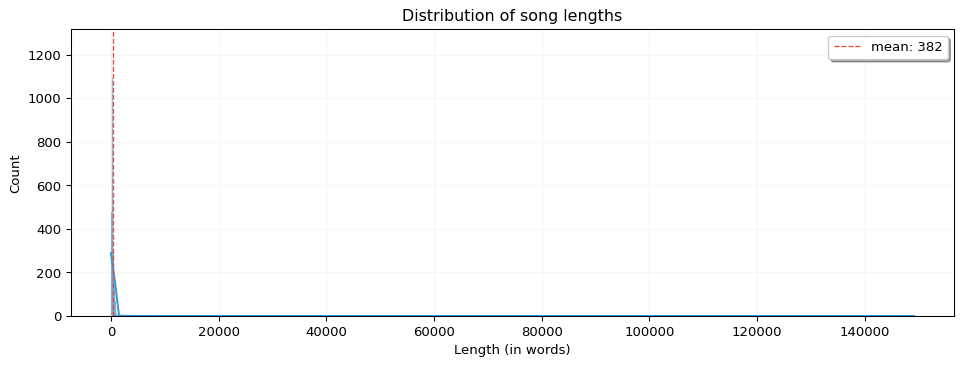

In [13]:
lengths = [len(lyrics.split()) for lyrics in song_data.lyrics]
# lengths = sorted(lengths, reverse=True)
fig, axes = plt.subplots(figsize=(12,4), dpi=95)
############# HISTOGRAM ##############
sns.histplot(ax=axes, x=lengths, kde=True, color='#3498DB', ls='--')
axes.grid(alpha = 0.1)
axes.axvline(np.mean(lengths), linewidth=1, color='#E74C3C', ls='--', 
                  label=f'mean: {round(np.mean(lengths))}')
axes.set_title('Distribution of song lengths')
axes.set_xlabel('Length (in words)')
axes.legend(loc='upper right',
          fancybox=True, shadow=True, ncol=1)

While doing a finer combing of the data, we also produced a blocklist for artists that we deemed unwanted in the data set. This list includes *Glee Cast* as they were present in over 200 songs, even though their songs are covers of other popular songs. The full list is seen here `['highest to lowest', 'marcel proust', 'watsky', 'glee cast', 'harttsick', 'eric the red', 'fabvl', 'c-mob', 'hampered']`.

In [14]:
cut_list = ["highest to lowest", "marcel proust", 'watsky', 'glee cast', 'harttsick', 'eric the red', 'fabvl', 'c-mob', 'hampered']
for cut in cut_list:
    for i in song_data.index.values:
        if cut in song_data.artists[i]:
            song_data = song_data.drop(i)
            #print(i, cut)

In [16]:
i = -1 

while True:
    
    lengths = [len(lyrics) for lyrics in song_data.lyrics]
    a = np.argsort(lengths)[-1]
    
    index = song_data.index.values[a]
    
    if len(song_data.lyrics[index]) < 10_000:
        break
#     print(len(song_data.lyrics[index]))
#     print(song_data.artists[index])
#     print(song_data.title[index])
#     print(song_data.lyrics[index])
#     print("="*100)
    song_data = song_data.drop(index)

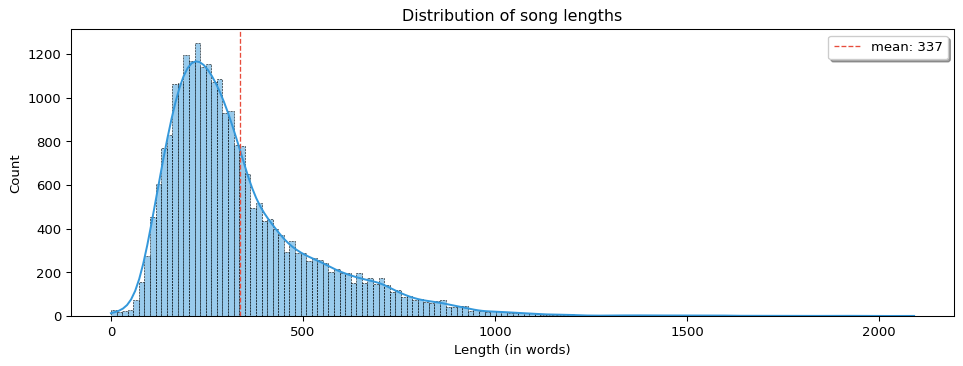

In [17]:
lengths = [len(lyrics.split()) for lyrics in song_data.lyrics]
# lengths = sorted(lengths, reverse=True)
# fig = plt.figure(dpi=135)
# plt.xlim(-1, max(lengths))
# plt.ylim(0, 1700)
# plt.title("Distribution of song lengths")
# plt.xlabel("Length (in characters)")
# plt.ylabel("Count")
# plt.hist(lengths, bins = 100, color='#3498DB', alpha=0.7)
# plt.vlines(np.mean(lengths), 0, 1800, colors='#E74C3C', alpha=0.7, label='Mean length')
# plt.legend()
# plt.savefig("../static/images/song_lengths.png", bbox_inches='tight')
# plt.show()

fig, axes = plt.subplots(figsize=(12,4), dpi=95)
############# HISTOGRAM ##############
sns.histplot(ax=axes, x=lengths, kde=True, color='#3498DB', ls='--')
axes.grid(alpha = 0)
axes.axvline(np.mean(lengths), linewidth=1, color='#E74C3C', ls='--', 
                  label=f'mean: {round(np.mean(lengths))}')
axes.set_title('Distribution of song lengths')
axes.set_xlabel('Length (in words)')
axes.legend(loc='upper right',
          fancybox=True, shadow=True, ncol=1)
plt.savefig("../static/images/song_lengths_sns.png", bbox_inches='tight')

#### Regrouping artists

As mentioned earlier, after gathering the data, we had to separate all artists to work with them properly, though in some cases, this results in one artist being split up into multiple - as was the case with *Earth, Wind & Fire*. To mitigate this problem, we first calculated how many times each artist appeared in the data set and, afterwards, for each artist, how many times they appeared with collaborating artists. Having known these values, we could then, for each artist, check which other artists they have collaborated with on all of their songs. Artists found using this method were then joined with an underscore, such that `['earth', 'wind', 'fire']` became `['earth_fire_wind']`.

In [18]:
for i in song_data.index.values:
    a = song_data.artists[i]
    for j,artist in enumerate(a):
        if ' (' in artist and ')' not in artist:
            a.pop(j)
            artist = artist.split(' (')[0].split(', ')
            song_data.artists[i] = a + artist
#             print(artist)
#             print(song_data.title[i])
#             print('')

In [19]:
artist_count = defaultdict(lambda: 0)
artist_colab_count = defaultdict(lambda: defaultdict(lambda: 0))

for artists in song_data.artists:
    for artist in artists:
        artist_count[artist] += 1
        for colab in artists:
            if colab != artist:
                artist_colab_count[artist][colab] += 1

In [20]:
artist_colab_count['wind']

defaultdict(<function __main__.<lambda>.<locals>.<lambda>()>,
            {'earth': 31, 'fire': 31, 'ramsey lewis': 1})

In [21]:
artist_count['wind']

31

In [22]:
regroupings = set()

for artist_a, songs_a in artist_count.items():
    colabs = [artist_a]
    for artist_b, songs_b in artist_colab_count[artist_a].items():
        if songs_b == artist_count[artist_b] == songs_a  and songs_a > 2:
            colabs.append(artist_b)
    if len(colabs) > 1:
        regroupings.add((songs_a, tuple(sorted(colabs))))

In [23]:
for i in song_data.index.values:
    for num, group in regroupings:
        if group[0] in song_data.artists[i]:
            if i < 5:
                print(f'Artists before: {song_data.artists[i]}')
            for g in group:
                song_data.artists[i].remove(g)
            song_data.artists[i].append("_".join(group))
            if i < 5:
                print(f'Artists after: {song_data.artists[i]}')
                print("")

### Preliminary look at the data
After doing all data processing and cleaning, the final data set is comprised of 25,419 songs and 7,855 unique artists. In the table below, the three data sets used throughout the project can be seen and downloaded.

| Data Set                                                                                             |  Songs | Size (mb) |
|:-----------------------------------------------------------------------------------------------------|-------:|----------:|
| [Billboard List](https://drive.google.com/file/d/1Gd4YH_U98Z8mellnIV_haINLL4UhLJKG/view?usp=sharing) | 29,128 |       1.6 |
| [Pre-cleaned](https://drive.google.com/file/d/1cyiIWnXD_0CHLsj8C0tcwNadfYI7z8FD/view?usp=sharing)    | 29,128 |      92.5 |
| [Cleaned](https://drive.google.com/file/d/1Zhof84KbTJa3a1zfhN3TcwdWqPFCTnEv/view?usp=sharing)        | 25,419 |      44.2 |

In [24]:
song_data = pd.read_pickle('songData.df')

In [25]:
artist_count = defaultdict(lambda: 0)
artist_colab_count = defaultdict(lambda: defaultdict(lambda: 0))

for artists in song_data.artists:
    for artist in artists:
        artist_count[artist] += 1
        for colab in artists:
            if colab != artist:
                artist_colab_count[artist][colab] += 1

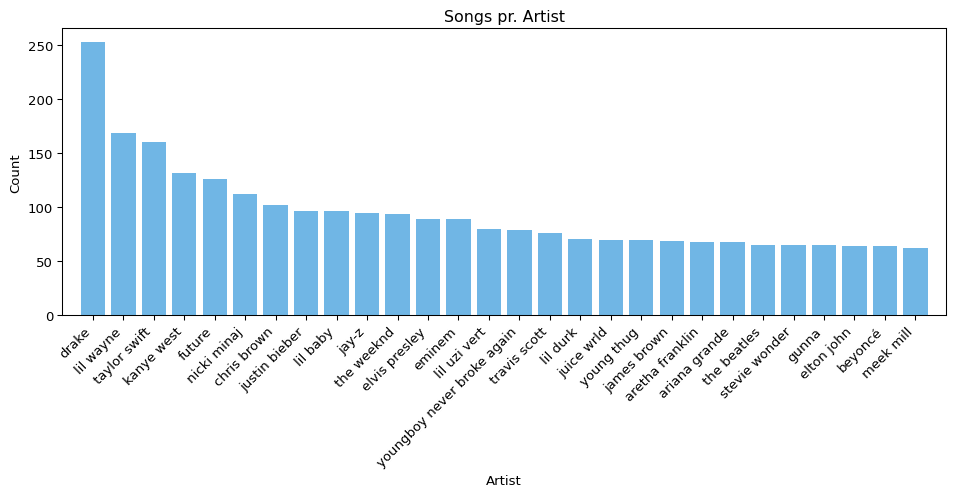

In [26]:
sorted_artists = {k: v for k, v in sorted(artist_count.items(), key=lambda item: item[1], reverse=True) if v > 60}
#for k, v in sorted_artists.items():
#    print(k + ':', v)

fig = plt.figure(figsize=(12,4), dpi=95)
plt.bar(*zip(*sorted_artists.items()), color='#3498DB', alpha=0.7)
plt.xlim(-1, len(sorted_artists.items()))
plt.xlabel('Artist')
plt.xticks(rotation=45, ha="right")
plt.ylabel('Count')
plt.title('Songs pr. Artist')
plt.savefig("../static/images/songs_per_artist.png", bbox_inches='tight')
plt.show()


# plotly_fig = tls.mpl_to_plotly(fig, resize=False)
# plotly_fig.update_layout(
#     xaxis = dict(
#         tickmode = 'array',
#         tickvals = list(np.arange(len(sorted_artists.keys()))),
#         ticktext = list(sorted_artists.keys())),
#     paper_bgcolor='rgba(0,0,0,0)',
#     plot_bgcolor='rgba(0,0,0,0)',
#     title_x =0.5,
#     margin=dict(l=5, r=5, t=20, b=5)
# )

# plotly.write_image(plotly_fig, plotly_folder + "songs_per_artist.json")
#iplot(plotly_fig)



From this figure, we can see that Drake has the most number of songs on the Billboard 'Hot-100' list. There's some good diversity in the type of artists with most songs on the list, but they all mainly fall into the rap, r&B or pop genres.

Creating a list of all unique genres and plotting the amount of songs in each genre

In [27]:
all_genres = set()
genre_count = {}

for genres in song_data.genres:
    for genre in genres:
        if genre in all_genres:
            genre_count[genre] += 1
        else:
            genre_count[genre] = 1
    all_genres = all_genres.union(set(genres))
    
print("Total genres:", len(all_genres))


Total genres: 612


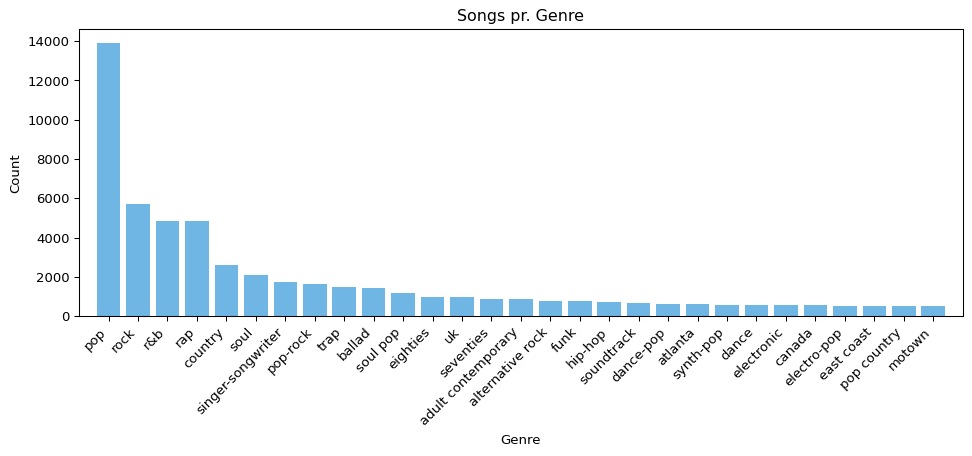

In [28]:
sorted_genres = {k: v for k, v in sorted(genre_count.items(), key=lambda item: item[1], reverse=True) if v > 500}
#for k, v in sorted_genres.items():
#    print(k + ':', v)

fig = plt.figure(figsize=(12,4), dpi=95)
plt.bar(*zip(*sorted_genres.items()), color='#3498DB', alpha=0.7)
plt.xlim(-1, len(sorted_genres.items()))
plt.xlabel('Genre')
plt.xticks(rotation=45, ha="right")
plt.ylabel('Count')
plt.title('Songs pr. Genre')
plt.savefig("../static/images/songs_per_genre.png", bbox_inches='tight')
plt.show()

# plotly_fig = tls.mpl_to_plotly(fig, resize=False)
# plotly_fig.update_layout(
#     xaxis = dict(
#         tickmode = 'array',
#         tickvals = list(np.arange(len(sorted_genres.keys()))),
#         ticktext = list(sorted_genres.keys())),
#     paper_bgcolor='rgba(0,0,0,0)',
#     plot_bgcolor='rgba(0,0,0,0)',
#     title_x =0.5,
#     margin=dict(l=5, r=5, t=20, b=5)
# )

# plotly.write_image(plotly_fig, plotly_folder + "songs_per_genre.json")
#iplot(plotly_fig)

Most songs fall into the pop genre, with rock, r&b and rap taking 2nd to 4th place. This is not surprising as all these genres have been hugely popular since 1960. Rap, however, only saw its inception in the 1990s but has become a staple in the music industry since then.

And doing the same for decades:

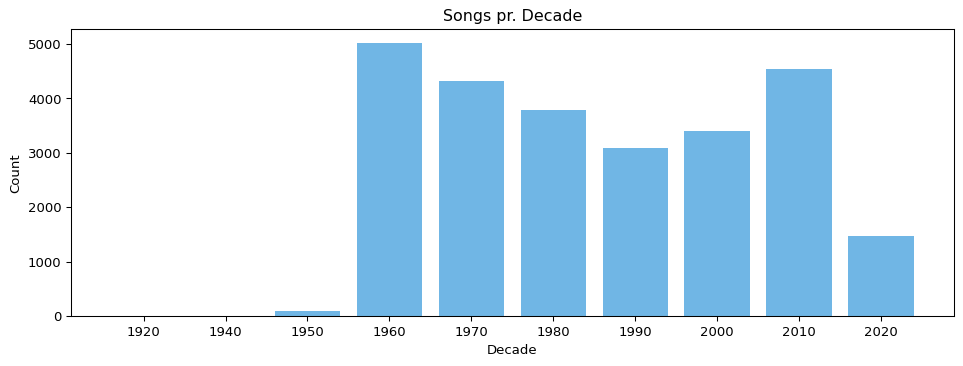

In [29]:
decade_count = defaultdict(lambda: 0)
for date in song_data.released:
    year = (int(date[:4]) // 10) * 10
    decade_count[str(year)] += 1

decade_count = {k: v for k, v in sorted(decade_count.items(), key=lambda item: int(item[0])) if v > 1}

fig = plt.figure(figsize=(12,4), dpi=95)
plt.bar(*zip(*decade_count.items()), color='#3498DB', alpha=0.7)
plt.xlabel('Decade')
plt.ylabel('Count')
plt.title('Songs pr. Decade')
plt.savefig("../static/images/songs_per_decade.png", bbox_inches='tight')
plt.show()

# plotly_fig = tls.mpl_to_plotly(fig, resize=False)
# plotly_fig.update_layout(
#     xaxis = dict(
#         tickmode = 'array',
#         tickvals = list(np.arange(len(decade_count.keys()))),
#         ticktext = list(decade_count.keys())),
#     paper_bgcolor='rgba(0,0,0,0)',
#     plot_bgcolor='rgba(0,0,0,0)',
#     title_x =0.5,
#     margin=dict(l=5, r=5, t=20, b=5)
# )

# plotly.write_image(plotly_fig, plotly_folder + "songs_per_decade.json")
#iplot(plotly_fig)

A quick look at the distribution of songs through the decades shows us that many old songs make it to the list, with 1960 having more songs than any other decade on the 'Hot-100' list. 2010 saw a steep increase in the number of songs on the list compared to previous years. Perhaps there was a shift in what kind of music we listened to.

### Characteristics of the data
The data has now been gathered and thoroughly cleaned, but before we are ready to apply our network science and text analysing techniques to it, we will first look at [_the ten characteristics of Big Data_](https://www.bitbybitbook.com/en/1st-ed/observing-behavior/characteristics/):

> ### Big

As mentioned previously, the data set comprises 25,419 songs and 7,855 unique artists, but in addition, the lyric corpus has a total size of 8,476,446 with 74,915 unique tokens. With this type of information, a data set of this size would be tough to come by other than scraping the internet.


> ### Always-on

Billboard updates their 'The Hot 100' chart each week, which means the list has been updated since we first collected the data. Because it updates each week, the data set can be updated 52 times a year, which makes the data longitudinal, but since it updates only 52 times a year and not constantly like, e.g. Twitter, it is not entirely _always-on_.

> ### Non-reactive

Reactivity describes whether subjects know researchers are observing them because that might change the subjects' behaviour. All musical artists are most likely aware that they are present on the chart and might follow their ranking closely, but the question is how much they change their behaviour and musical style to get a higher ranking on the chart. One could speculate that some artists might change their use of words and language to appeal to a broader audience to perform better on the chart, while others follow their musical heart. Though, with this being said, we do not believe that the fact that researchers might also be looking at the chart with the intent to do network science and text analysis will change the behaviour of the artists.

> ### Incomplete

Completeness express if the data set manages to capture the entire unfolding of a specific event or, e.g., the entire network of a specific group. In the case of this project, we are attempting to analyse the network and text of the most popular artists and songs through modern time. With this in mind, we believe that using Billboard's 'The Hot 100' chart gives a good indication of the most popular artists and songs, though arguments could be made for the case that the chart might be skewed towards music popular in the states.


> ### Inaccessable

The data used in this project is very much accessible. As was accounted for earlier on this page, everything has been downloaded freely off the internet via different APIs.

> ### Nonrepresentative

Representativity denotes whether the data can generalise to, e.g., social phenomena more in general - out-of-sample generalisation. To this end, being a musician is quite a unique occupation when it comes to a social network of collaboration, in comparison to, e.g. a profession like acting. One could presume the typical actor is more connected than the typical musician since many actors are associated with a movie or tv-show, while often not many musicians are working on a song. At least not many musicians are seen shown as the artists on a given song, while many people might have worked on it during the songwriting and musical production.
Additionally, since our data set only contains songs in English from a popular music chart in the west, the data might not be suited for generalisation of the network, or text, for musicians from other parts of the planet. With this being said, the data set is probably still perfectly applicable for within-sample comparisons.

> ### Drifting

There is some systemic drifting in the data set, as the way songs were picked for the 'Hot-100' list has changed since its inception back in 1958. Originally, songs were selected purely based on how well they sold. Still, as the music industry evolved and radio, tv, and streaming started becoming more prevalent, all these factors are now considered when songs are picked for the list.

> ### Algorithmically confounded

As the songs are only picked from the Billboard 'Hot-100' list, there is some algorithmic confounding going on. What is meant by this is that we don't know precisely how Billboard's algorithm for selecting the songs for their charts works.

> ### Dirty

The data set could be dirty as some songs could still be loaded wrongly, or we might have missed something via the cleaning. Furthermore, the data is not a complete overview of the connections between artists or their language, as we only chose songs that appeared on the 'Hot-100' list.

> ### Sensitive

The data is not sensitive, as there is no information in it that isn't already public, as well as the data just being elementary stats, release year, song title, song artists.

# 3.Tools, theory and analysis. 
## Network
This section of the notebook will go through the network analysis of the data. We have used `networkx` to build the networks and `netwulf` to visualise them. In the following sections, we will be investigating the full network of all musicians and a subset of them based on selected genres. The networks will be studied by calculating different statistics, such as the number of nodes, number of links, density, clusterings, etc. In addition, we will look at community detection to see how well the different genres manage to partition the networks into communities compared to the Louvain algorithm for community detection.

In [30]:
song_data = pd.read_pickle('songData.df')
print(f'Number of songs: {len(song_data)}')

Number of songs: 25706


Network visualisation config.

In [31]:
with open('network_figures/config.txt') as f:
    data = f.read()
config = json.loads(data)

## Creating the full network
Calculate all genres associated to each artist as well as how many songs they have made for each genre.

In [32]:
all_artists = set()
artist_genres = dict()
artist_genres_count = defaultdict(lambda: defaultdict(lambda: 0))
for artists, genres in zip(song_data.artists, song_data.genres):
    for artist in artists:
        all_artists = all_artists.union(set([artist]))
        for genre in genres:
            artist_genres_count[artist][genre] += 1
        if artist in artist_genres.keys():
            artist_genres[artist] = artist_genres[artist].union(set(genres))
        else:
            artist_genres[artist] = set(genres)
        

all_artists = list(all_artists)
print(f'Number of unique artists: {len(all_artists)}')

Number of unique artists: 8079


Creating a list of 20 genres from which each artist can get their main genre label. In addition, a colour list to colour each node based on their main genre.

In [33]:
genre_list = ['pop', 'rock', 'rap', 'r&b', 'country', 'soul', 'ballad', 'hip-hop', 
              'trap', 'singer-songwriter', 'funk', 'eighties', 'seventies', 'soundtrack',
              'dance', 'electronic', 'folk', 'cover', 'jazz', 'blues']

In [34]:
colour_list = ['#E74C3C', '#8E44AD', '#3498DB', '#2ECC71', '#F39C12', '#F1C40F', '#F5B7B1', '#5D6D7E', 
               '#AED6F1','#F5B7B1', '#FCF3CF', '#DCB9ED', '#8F2323', '#8F6A23', '#4F8F23', '#23628F', 
               '#6B238F', '#AED6F1','#A3E4D7', '#D4AC0D', '#D7BDE2']

In [35]:
genre_to_colour_dict = {}
for colour, genre in zip(colour_list, genre_list):
    genre_to_colour_dict[genre] = colour

Calculate number of songs each artist has in the data set as well as how many times they have collaborated with other artists.

In [36]:
artist_count = defaultdict(lambda: 0)
artist_colab_count = defaultdict(lambda: defaultdict(lambda: 0))

for artists in song_data.artists:
    for artist in artists:
        artist_count[artist] += 1
        for colab in artists:
            if colab != artist:
                artist_colab_count[artist][colab] += 1

### Add nodes
Add each artist as a node with three attributes
> *genre*: most common genre for that artist within the fixed list 'genre_list'

> *size*: number of times the artist has appeared on Billboard's the hot 100 (used to give each node the correct size)

> *all_genres*: all genres associated with that artist

> *group*: the colour of the genre associated with the artist

If an artist has multiple most common genres, meaning that they, e.g. have made five pop songs and five rock songs, that artist's *genre* attribute will be picked at random amongst the most common genres. An exception is with _rap_ and _trap_; because trap is a subgenre of rap (but still a significant and defined genre), we deem it more appropriate to label artists as _trap_, if they have an equal number of rap and trap songs.

In [37]:
G = nx.Graph()
for artist in all_artists:
    most_occurences = 0
    rap_count = 0
    trap_count = 0
    max_key = 'other'
    random.shuffle(genre_list)
    
    for genre in genre_list:
        if genre in artist_genres_count[artist]:
            if genre == 'rap':
                rap_count = artist_genres_count[artist][genre]
            if genre == 'trap':
                trap_count = artist_genres_count[artist][genre]             
            
            if artist_genres_count[artist][genre] > most_occurences:
                most_occurences = artist_genres_count[artist][genre]
                max_key = genre
                
    if (rap_count > 0) and (rap_count == trap_count) and (max_key in ['rap', 'trap']):
        max_key = 'trap'
    
    G.add_node(artist, 
               genre=max_key, 
               size=artist_count[artist], 
               all_genres=artist_genres[artist], 
               group=genre_to_colour_dict[max_key])
    
G.number_of_nodes()
print(f'Number of nodes: {G.number_of_nodes()}')

Number of nodes: 8079


### Add edges
Add edges between two artists if they have collaborated on a song and weigh the edge by the number of times they have collaborated.

In [38]:
linked_artists = set()
for artists in song_data.artists:
    if len(artists) > 1:
        for comb in combinations(artists, 2):
            if not comb[0] == comb[1]:
                linked_artists = linked_artists.union({tuple([comb[0], comb[1], artist_colab_count[comb[0]][comb[1]]])})

linked_artists = list(linked_artists)
G.add_weighted_edges_from(linked_artists)
print(f'Number of edges: {G.number_of_edges()}')

Number of edges: 7273


### Helper functions

In [39]:
def randomized_graph(graph, N):
    g = graph.copy()
    swaps = 0
    while swaps < N:
        uv = random.choice(list(g.edges()))
        if uv[0] == uv[1]:
            uv = random.choice(list(g.edges()))
        xy = random.choice(list(g.edges()))
        while uv[1] == xy[0]:
            xy = random.choice(list(g.edges()))
        if not g.has_edge(uv[0], xy[1]) and not g.has_edge(uv[1], xy[0]):
            g.remove_edges_from([uv, xy])
            g.add_edges_from([(uv[0], xy[1]), (uv[1], xy[0])])
            swaps += 1
    return g

In [40]:
def naive_randomized_graph(graph):
    g = nx.MultiGraph(graph)
    edges = list(g.edges())
    sources = [a for a, b in edges]
    targets = [b for a, b in edges]
    unique_list = sources + targets
    random.shuffle(unique_list)
    new_edges = [(unique_list[i], unique_list[i+1]) for i in range(0, len(unique_list)-1, 2)]
    g.remove_edges_from(edges)
    g.add_edges_from(new_edges)
    return g

In [41]:
def get_network_by_genre(G, genre):
    genre_nodes = [node for node, data in G.nodes(data=True) if genre in data['all_genres']]
    return G.subgraph(genre_nodes)

In [42]:
def get_partitioning(filtered_graph):
    partitioning = []
    nc = set(nx.get_node_attributes(filtered_graph, 'group').values())
    for i in nc:
        nodes = (
            node
            for node, data
            in filtered_graph.nodes(data=True)
            if data.get("group") == i
        )
        partitioning.append(filtered_graph.subgraph(nodes))
    return partitioning

In [43]:
def modularity(graph, partitioning):
    M = 0
    L = graph.number_of_edges()
    for subgraph in partitioning:
        Lc = subgraph.number_of_edges()
        kc = sum(graph.degree[node] for node in subgraph.nodes())
        M += Lc/L - (kc / (2 * L))**2
    return M

### Deciding which genre networks to analyse
It was previously decided that each artist could get their main label based on `genre_list`. Though, analysing and visualising 20 different networks can get a bit cumbersome, so we will be picking out a subset of these. To do this, we will first find out how many artists have each genre as their primary genre and how many times each genre has occurred in total.

In [44]:
main_genre_sizes = defaultdict(lambda: 0)
for art, data in G.nodes(data=True):
    main_genre_sizes[data['genre']] += 1

In [45]:
all_genre_sizes = defaultdict(lambda: 0)
for art, data in G.nodes(data=True):
    for g in data['all_genres']:
        all_genre_sizes[g] += 1

In [46]:
{k: v for k, v in sorted(main_genre_sizes.items(), key=lambda item: item[1], reverse=True)}

{'pop': 3529,
 'rap': 1847,
 'rock': 946,
 'r&b': 641,
 'country': 385,
 'trap': 168,
 'soul': 91,
 'soundtrack': 82,
 'hip-hop': 69,
 'electronic': 53,
 'dance': 48,
 'singer-songwriter': 40,
 'ballad': 39,
 'eighties': 32,
 'folk': 25,
 'seventies': 23,
 'funk': 22,
 'cover': 19,
 'jazz': 11,
 'blues': 9}

In [47]:
_ = [print(x) for x in list({k: v for k, v in sorted(all_genre_sizes.items(), key=lambda item: item[1], reverse=True)}.items())[:25]]

('pop', 4922)
('rap', 2601)
('rock', 1826)
('r&b', 1641)
('soul', 725)
('ballad', 698)
('pop-rock', 676)
('country', 624)
('soundtrack', 605)
('hip-hop', 593)
('singer-songwriter', 565)
('adult contemporary', 459)
('soul pop', 454)
('eighties', 445)
('trap', 440)
('dance', 430)
('electronic', 424)
('uk', 406)
('funk', 394)
('cover', 389)
('seventies', 381)
('alternative rock', 370)
('dance-pop', 365)
('east coast', 364)
('synth-pop', 328)


The genres we have decided to pick out are based on the number of times these genres occur and genres we deem interesting. Based on the results seen above, the following 11 genres' networks will be analysed: 

_pop_, _rap_, _rock_, _R&B_, _country_, _soul_, _ballad_, _hip-hop_, _trap_, _singer-songwriter_ and _funk_. 

## Analysis
The full network has now been created, and we are ready to do visualisations and analyses. We will be working with the full network and sub-networks described above in the following sections. We will be investigating the full network and versions of the networks where singleton nodes with less than five songs are removed for each network. 

The reasoning for only removing singleton nodes with less than five songs is that we want to make the networks as clear as possible while still maintaining the singleton artists that are influential for the genre at hand.

### _NB: Networks are not meant to be looked at here in the notebook but rather in the network section on the website._

### With singletons

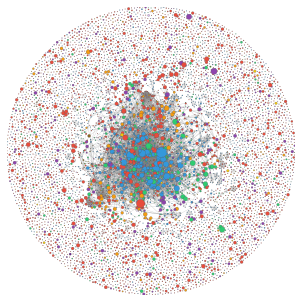

In [49]:
network_G, _ = nw.visualize(G, config=config, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network_G)
#plt.savefig("network_figures/G.png")

In [50]:
print(f'Number of Nodes: {G.number_of_nodes()}')
print(f'Number of Links: {G.number_of_edges()}')
print(f'Density: {nx.density(G):.5f}')
print(f'Avg. clustering: {nx.average_clustering(G):.2f}')
degrees = list(dict(G.degree()).values())
print(f'Average degrees: {np.mean(degrees):.2f}')
print(f'Median degrees: {np.median(degrees)}')
print(f'Mode of degrees: {stats.mode(degrees)[0][0]}')
print(f'Minimum degree: {min(degrees)}')
print(f'Maximum degree: {max(degrees)}')

Number of Nodes: 8079
Number of Links: 7273
Density: 0.00022
Avg. clustering: 0.16
Average degrees: 1.80
Median degrees: 0.0
Mode of degrees: 0
Minimum degree: 0
Maximum degree: 108


From these basic statistics we see that the number of nodes in the networks is 7854 and the number of links is 6799. 

The density of an undirected graph is given by:

\begin{align}
d=\frac{2m}{n(n-1)},
\end{align}

where $m$ is the number of edges, and $n$ is the number of nodes. The interpretation of the measure is that the density is 0 for a graph without edges and 1 for a completely connected graph and is, therefore, a measure of how dense a graph is wrt. edge connectivity. In this case, the network has a density of 0.00022. This can be a little hard to interpret, which is why we've also calculated the average clustering coefficient, which is given by:

\begin{align}
\overline{C}=\frac{1}{N} \sum_{i=1}^N \frac{2L_i}{k_i(k_i-1)},
\end{align}

where $L_i$ is the number of links between the $k_i$ neighbours of node $i$. The interpretation of this measure is the probability that two neighbours of a randomly selected node link to each other. For this network, we have an average clustering coefficient of 0.16.

Lastly, we see that the average degree of the nodes in the graph is 1.73, which means that a node on average is connected to 1.73 other nodes. We also see that the minimum, median and mode of degrees are 0, whereas the maximum degree is 108.

##### Analysis of degrees
We will now analyse the degrees of the network a bit more thoroughly by looking at the distribution of degrees on a log-log scale. The reasoning for this is that a common feature of real-world networks is hubs - meaning that a few nodes in a network are highly connected to other nodes. [_Scale-free networks_](https://mathinsight.org/scale_free_network) are networks with large hubs, and a power-law degree distribution characterises such networks.

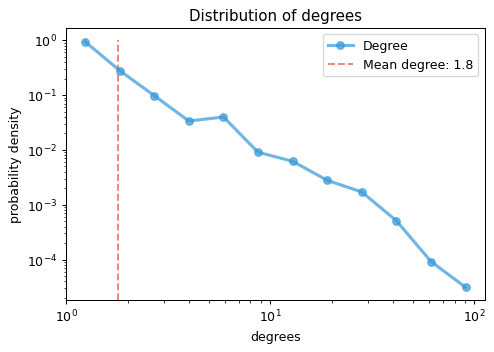

In [51]:
bins = np.logspace(0, np.log10(max(degrees)), 13)
density = True
hist, edges = np.histogram(degrees, bins=bins, density = density)
x = (edges[1:] + edges[:-1])/2
width = bins[1] - bins[0]

fig, ax = plt.subplots(dpi=90)
ax.plot(x, hist, marker='.', alpha=0.7, linewidth=2.5, markersize=12, color='#3498DB', label='Degree')
ax.vlines(np.mean(degrees), 0, 1, ls='--', colors='#E74C3C', alpha=0.7, label=f'Mean degree: {np.mean(degrees):.1f}')
ax.set_xlabel('degrees')
if density:
    ax.set_ylabel('probability density')
else:
    ax.set_ylabel('counts')
ax.legend()
ax.set_title('Distribution of degrees')
ax.set_yscale("log")
ax.set_xscale("log")

plt.savefig("../static/images/distribution_of_degrees_90.png", bbox_inches='tight')

Looking at the figure above, we see exactly that the network's degree distribution follows a power law, which thus gives a good indication that we are dealing with a real-world network compared to a random network.

#### Community detection
In this section, we will explore the communities of the network. To do this, we are looking at the partition obtained when grouping the artists by their genre. This will be compared to the partition obtained using the Louvain algorithm. To indicate whether the two partitions are good at dividing the network into modules, both of these partitions will then be juxtapositioned with random networks based on the real network. When making this comparison, we can see if the modularity of the two partitions is significantly different from 0.

First off, we will be getting the partitions based on the genres.

In [52]:
genre_partitioning = get_partitioning(G)
genre_partitioning_dict = dict()
for partition in genre_partitioning:
    for artist, data in partition.nodes(data=True):
        genre_partitioning_dict[artist] = data['group']

print(f'Genre partitioning modularity using homemade modularity function: {modularity(G, genre_partitioning):.4f}')
print(f'Genre partitioning modularity using python-louvain modularity function: {community.modularity(genre_partitioning_dict, G):.4f}')

Genre partitioning modularity using homemade modularity function: 0.3263
Genre partitioning modularity using python-louvain modularity function: 0.3415


We will now be calculating the modularity of the network based on the partitioning obtained using the Louvain algorithm.

In [53]:
louvain_modularity = community.modularity(community.best_partition(G), G)
print(f'Modularity for the full network: {louvain_modularity:.4f}')

Modularity for the full network: 0.7600


We initially see that the Louvain algorithm's modularity is more than twice as large as when using the genres.

##### Building randon network for comparison
Next up, we will generate 1000 random networks using the double edge swap algorithm. This makes each node in the new random network have the same degree as it had in the original networks, but the connections are different. For each of these random networks, we will be partitioning them using the genres and calculate their modularities. We do 1.2*number of edges swaps to ensure we get an entirely random version of the network.

In [54]:
modularity_list = []
N = 1000
# graph = G.copy()
for i in tqdm(range(N)):
    graph = G.copy()
    RG = nx.double_edge_swap(graph, nswap=graph.number_of_edges()*1.2, max_tries=10000, seed=None)
    new_RG = nw.get_filtered_network(RG, node_group_key='group')
    RG_partitioning = get_partitioning(new_RG)
    modularity_list.append(modularity(RG, RG_partitioning))

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [04:52<00:00,  3.42it/s]


In [55]:
print(f'Average modularity of random networks: {np.mean(modularity_list):.4f}')
print(f'Standard deviation of modularity of random networks: {np.std(modularity_list):.4f}')

Average modularity of random networks: 0.0265
Standard deviation of modularity of random networks: 0.0048


We see that the mean and standard deviation of the modularity is 0, which is to be expected, as the networks are random, and we, therefore, shouldn't have any good partition using the genres.

To understand the genre partition and the Louvain algorithm partition, we will plot the distribution of the configuration model's modularity alongside the genre partition's modularity and the Louvain algorithm partition's modularity.

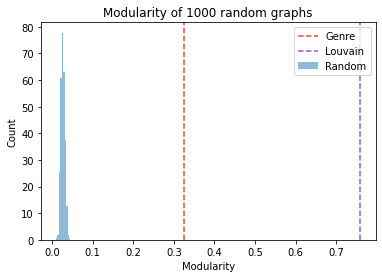

In [56]:
plt.hist(modularity_list, bins=10, alpha=0.5, label='Random', density=True)
plt.axvline(modularity(G, genre_partitioning), color = '#E74C3C', linestyle='--', label='Genre')
plt.axvline(louvain_modularity, color = '#9B59B6', linestyle='--', label='Louvain')
plt.legend()
plt.title(f'Modularity of {N} random graphs')
plt.xlabel('Modularity')
plt.ylabel('Count')
plt.show()

The figure above shows that both partitioning methods lead to a modularity significantly different from 0 and thereby larger than any of those from the random networks. We can thus deem that the network is not random through the modularity measure. Though, as touched upon previously, the modularity of the networks partitioned using the Louvain algorithm is more than twice the size of the genre partition. To understand how this partition looks, we will be visualising the graph with the Louvain partitioning.

In [57]:
G_louvain_partition = community.best_partition(G)
G_louvain = G.copy()
for artist, data in G_louvain.nodes(data=True):
    data['group'] = G_louvain_partition[artist]

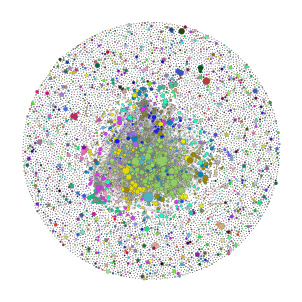

In [58]:
network_G_louvain, _ = nw.visualize(G_louvain, config=config, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network_G_louvain)

Noticeable here is that the Louvain algorithm also groups many of the rap, pop, rock and country artists together into four separate groups, though in general, also a lot more groups are seen. Let's see just how many groups:

In [59]:
print(f'Number of groups using genres: {len(set(data["group"] for art, data in G.nodes(data=True)))}')
print(f'Number of groups using Louvain: {max(G_louvain_partition.values())+1}')

Number of groups using genres: 18
Number of groups using Louvain: 5095


We see that the Louvain algorithm partitions the network into an immense 4994 groups, which is enormous compared to the 7854 nodes in the graph. An explanation for this is that many singleton nodes are probably given their own group, which gives a good partitioning but doesn't make much sense compared to partitioning using genres.

#### Betweenness centrality
As mentioned previously, we have decided to weigh the nodes in the network with the number of songs that the artist has in the data set. The advantage of this is that the most popular artists will be the easiest ones to see; this is especially the case for older artists who haven't collaborated as much - such as Elvis Presley or The Beatles. Artists like these would be virtually invisible if we weighted the nodes by the strength of their connections. Though, weighing nodes by the strength of their connections tell a great deal about which nodes are the biggest collaborators and, thereby, some of the most central nodes in the graph.

We will, therefore, in this section deal with [_betweenness centrality_](https://en.wikipedia.org/wiki/Betweenness_centrality) that, for each node in a graph, is a measure of how central that node is. The measure is based on shortest paths so that the betweenness centrality for each node is the number of shortest paths that pass through the node. The formula for betweenness centrality is given by:

\begin{align}
BC(n)=\sum_{s\neq v \neq t} \frac{\sigma_{s,t}(n)}{\sigma_{s,t}},
\end{align}

where $\sigma_{s,t}$ is the total number of shortest paths from node $s$ to node $t$ and $\sigma_{s,t}(n)$ is the number of those paths that pass through $n$.

Combining this with weighing the artists by the number of songs they have in the data set will give us a great overview of the most popular artists and the most central, collaboratory, and connective artists.

In [60]:
bc = nx.betweenness_centrality(G)
sorted_bc = {k: v for k, v in sorted(bc.items(), key=lambda item: item[1], reverse=True)}
{k:v for k, v in list(sorted_bc.items())[:20]}

{'lil wayne': 0.005023970550920831,
 'kanye west': 0.004432003820360854,
 'drake': 0.004197969508689598,
 'nicki minaj': 0.003618482295013173,
 'chris brown': 0.003409014405779317,
 'quincy jones': 0.0032170842776790614,
 'ludacris': 0.003132771594697594,
 'snoop dogg': 0.003112365297176812,
 'mariah carey': 0.0027966731820614466,
 'usher': 0.0027480671967596766,
 'jay-z': 0.0026838272719125664,
 'fat joe': 0.002373255664088242,
 'james ingram': 0.0022984208053862115,
 't.i.': 0.0021649631078659295,
 'travis scott': 0.002161676030420683,
 'stevie wonder': 0.002152689703629887,
 'eminem': 0.0020126325393940545,
 'll cool j': 0.001968864960368148,
 'mary j. blige': 0.001912284868599049,
 'janet jackson': 0.0018828904840405716}

Having calculated the betweenness centrality for each node, we see many rappers present in the top-20. This is not too surprising given the number of rap artists, their tendency to collaborate and the graph we were looking at earlier. Though we also see names like Quincy Jones, James Ingram and Stevie Wonder - it is interesting to see those artists playing a central part in the network.

### Without singletons
The next part of the analysis for the full network is the version where we will be removing singleton nodes with less than five songs. The following section will go through the same steps as the complete network, so not everything will be described with the same level of detail.

In [61]:
G_no_singles = G.copy()
for artist, data in G.nodes(data=True):
    if G_no_singles.degree(artist) == 0 and data['size'] < 5:
        G_no_singles.remove_node(artist)

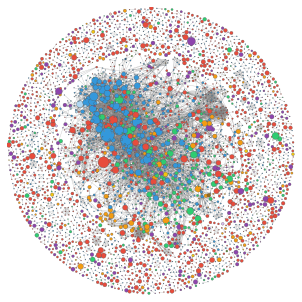

In [62]:
network_G_no_singles, _ = nw.visualize(G_no_singles, config=config, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network_G_no_singles)
# plt.savefig("network_figures/G_no_singles.pdf")

#### Properties
Calculate basic statistics for the network

In [63]:
graph = G_no_singles
print(f'Number of Nodes: {graph.number_of_nodes()}')
print(f'Number of Links: {graph.number_of_edges()}')
print(f'Density: {nx.density(graph):.5f}')
print(f'Avg. clustering: {nx.average_clustering(graph):.2f}')
degrees = list(dict(graph.degree()).values())
print(f'Average degrees: {np.mean(degrees):.2f}')
print(f'Median degrees: {np.median(degrees)}')
print(f'Mode of degrees: {stats.mode(degrees)[0][0]}')
print(f'Minimum degree: {min(degrees)}')
print(f'Maximum degree: {max(degrees)}')

Number of Nodes: 4306
Number of Links: 7273
Density: 0.00078
Avg. clustering: 0.30
Average degrees: 3.38
Median degrees: 1.0
Mode of degrees: 1
Minimum degree: 0
Maximum degree: 108


We have now gone down from 7854 to 4154 nodes compared to the full network while keeping the same number of edges. As expected, all the other network properties have gone up, meaning that with a larger density, avg. clustering and average degrees, we should now see a more densely connected network.

##### Analysis of degrees

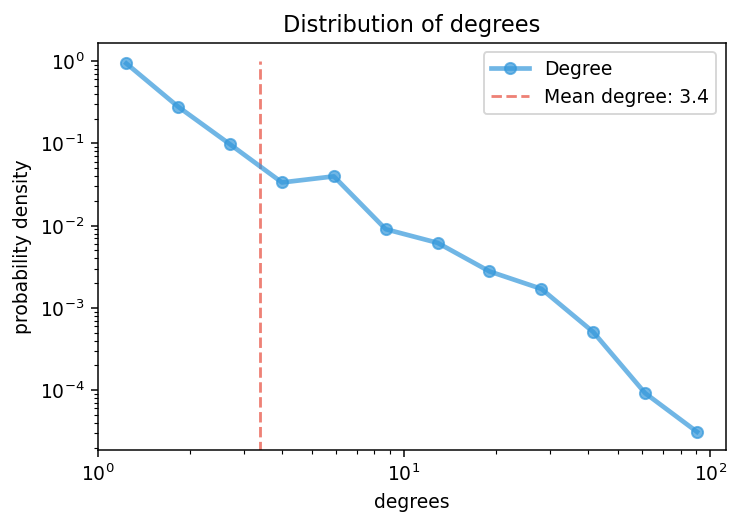

In [64]:
bins = np.logspace(0, np.log10(max(degrees)), 13)
density = True
hist, edges = np.histogram(degrees, bins=bins, density = density)
x = (edges[1:] + edges[:-1])/2
width = bins[1] - bins[0]

fig, ax = plt.subplots(dpi=135)
ax.plot(x, hist, marker='.', alpha=0.7, linewidth=2.5, markersize=12, color='#3498DB', label='Degree')
ax.vlines(np.mean(degrees), 0, 1, ls='--', colors='#E74C3C', alpha=0.7, label=f'Mean degree: {np.mean(degrees):.1f}')
ax.set_xlabel('degrees')
if density:
    ax.set_ylabel('probability density')
else:
    ax.set_ylabel('counts')
ax.legend()
ax.set_title('Distribution of degrees')
ax.set_yscale("log")
ax.set_xscale("log")

Looking at the figure above, we again see that the degree distribution follow a power-law.

#### Community detection
We will again build network communities using both the genres and the Louvain algorithm, both of which will be compared to random networks.

First off, we will be getting the partitions based on the genres.

In [65]:
genre_partitioning = get_partitioning(G_no_singles)
genre_partitioning_dict = dict()
for partition in genre_partitioning:
    for artist, data in partition.nodes(data=True):
        genre_partitioning_dict[artist] = data['group']

print(f'Genre partitioning modularity using homemade modularity function: {modularity(G_no_singles, genre_partitioning):.4f}')
print(f'Genre partitioning modularity using python-louvain modularity function: {community.modularity(genre_partitioning_dict, G_no_singles):.4f}')

Genre partitioning modularity using homemade modularity function: 0.3263
Genre partitioning modularity using python-louvain modularity function: 0.3415


We here see a modularity that is exactly the same as before. The formula for the modularity is given by [(cf. eq, 9.12 of the NS book)](http://networksciencebook.com/chapter/9#modularity):

\begin{align}
M= \sum_{c=1}^{n_c}\left\lfloor \frac{L_c}{L}-\left(\frac{k_c}{2L} \right)^2 \right\rfloor,
\end{align}

where $n_c$ is the number of communities, $L_c$ is the number of links in community $c$, $L$ is the total number of links in the network, and $k_c$ is the total degree of community $c$. Therefore, this means that the modularity doesn't depend at all on the number of nodes, and since these are the only things removed from the full network, the modularity doesn't change.

We will now be calculating the network's modularity based on the partitioning obtained using the Louvain algorithm.

In [66]:
louvain_modularity = community.modularity(community.best_partition(G_no_singles), G_no_singles)
print(f'Modularity for the full network: {louvain_modularity:.4f}')

Modularity for the full network: 0.7577


We initially see that the modularity obtained using the Louvain algorithm is almost the same as for the full network (0.7440). This is due to the Louvain algorithm not being fully optimal and non-deterministic. So as for the full graph, the modularity of the Louvain partition is more than twice the size of the genre partition.

##### Building randon network for comparison
Next up, we will generate 1000 random networks using the double edge swap algorithm. For each of these random networks, we will be partitioning them using the genres and calculate their modularities.

In [67]:
modularity_list = []
N = 1000
for i in tqdm(range(N)):
    graph = G_no_singles.copy()
    RG = nx.double_edge_swap(graph, nswap=graph.number_of_edges()*1.2, max_tries=10000, seed=None)
    new_RG = nw.get_filtered_network(RG, node_group_key='group')
    RG_partitioning = get_partitioning(new_RG)
    modularity_list.append(modularity(RG, RG_partitioning))

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [03:56<00:00,  4.24it/s]


In [68]:
print(f'Average modularity of random networks: {np.mean(modularity_list):.4f}')
print(f'Standard deviation of modularity of random networks: {np.std(modularity_list):.4f}')

Average modularity of random networks: 0.0265
Standard deviation of modularity of random networks: 0.0048


We see that the mean and standard deviation of the modularity is 0, which is to be expected, as the networks are random, and we, therefore, shouldn't have any good partition using the genres.

To understand the genre partition and the Louvain algorithm partition, we will plot the distribution of the configuration model's modularity alongside the genre partition's modularity and the Louvain algorithm partition's modularity.

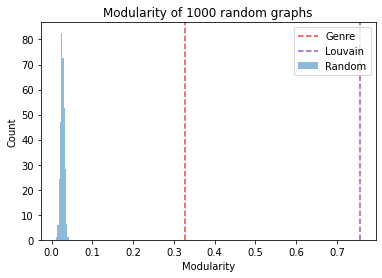

In [69]:
plt.hist(modularity_list, bins=10, alpha=0.5, label='Random', density=True)
plt.axvline(modularity(G_no_singles, genre_partitioning), color = '#E74C3C', linestyle='--', label='Genre')
plt.axvline(louvain_modularity, color = '#9B59B6', linestyle='--', label='Louvain')
plt.legend()
plt.title(f'Modularity of {N} random graphs')
plt.xlabel('Modularity')
plt.ylabel('Count')
plt.show()

The figure above shows that both partitioning methods lead to a modularity significantly different from 0 and thereby also larger than any of those from the random networks. Though, as touched upon previously, the modularity of the networks partitioned using the Louvain algorithm is more than twice the size of the genre partition. To understand how this partition looks, we will be visualising the graph with the Louvain partitioning.

In [70]:
G_no_singles_louvain_partition = community.best_partition(G_no_singles)
G_no_singles_louvain = G_no_singles.copy()
for artist, data in G_no_singles_louvain.nodes(data=True):
    data['group'] = G_no_singles_louvain_partition[artist]

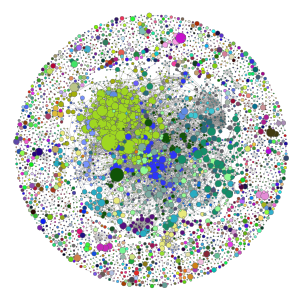

In [71]:
network_G_no_singles_louvain, _ = nw.visualize(G_no_singles_louvain, config=config, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network_G_no_singles_louvain)

As with the previous Louvain graph, the algorithm groups the main clumps of nodes together quite well. However, noticeable is that the rappers are divided into two groups (light green and black).

Let's see how many groups we have in this partitioning:

In [72]:
print(f'Number of groups using genres: {len(set(data["group"] for art, data in G_no_singles.nodes(data=True)))}')
print(f'Number of groups using Louvain: {max(G_no_singles_louvain_partition.values())+1}')

Number of groups using genres: 18
Number of groups using Louvain: 1321


We here see that the Louvain algorithm partitions the network into 1293 groups, which is a lot less compared to the 4992 of the last Louvain network. This means that the number of communities is reduced by 4994 - 1293 = 3701. Having lost 7854 - 4154 = 3700 nodes when removing singletons, it is confirmed that the Louvain algorithm gives all singleton nodes their own community.

Having now examined the full network for all genres for the musical artists, we will be moving on to analysing some of the most popular genres that we think are interesting.

## Pop network
Were here looking at the network of artists who has at least one song with the tag _pop_ in the data set. The size of the nodes will be determined by the number of songs they have with the tag _pop_.

In [73]:
genre = 'pop'
G_pop = get_network_by_genre(G, genre)
for artist, data in G_pop.nodes(data=True):
    data['size'] = artist_genres_count[artist][genre]

### With singletons

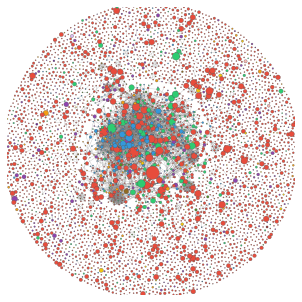

In [74]:
network_G_pop, _ = nw.visualize(G_pop, config=config, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network_G_pop)
# plt.savefig("network_figures/G.pdf")

#### Properties
Calculate basic statistics for the network

In [75]:
graph = G_pop
print(f'Number of Nodes: {graph.number_of_nodes()}')
print(f'Number of Links: {graph.number_of_edges()}')
print(f'Density: {nx.density(graph):.5f}')
print(f'Avg. clustering: {nx.average_clustering(graph):.2f}')
degrees = list(dict(graph.degree()).values())
print(f'Average degrees: {np.mean(degrees):.2f}')
print(f'Median degrees: {np.median(degrees)}')
print(f'Mode of degrees: {stats.mode(degrees)[0][0]}')
print(f'Minimum degree: {min(degrees)}')
print(f'Maximum degree: {max(degrees)}')

Number of Nodes: 4922
Number of Links: 4250
Density: 0.00035
Avg. clustering: 0.11
Average degrees: 1.73
Median degrees: 0.0
Mode of degrees: 0
Minimum degree: 0
Maximum degree: 74


In comparison to the full network, the pop network has approximately 3000 fewer nodes, 2900 fewer links, but the density, average clustering and average degree hasn't changes all that much.

#### Community detection
In this section we will explore the communities of the pop network. We will go through the same steps as previously.
First off, we will be getting the partitions based on the genres

In [76]:
genre_partitioning = get_partitioning(G_pop)
genre_partitioning_dict = dict()
for partition in genre_partitioning:
    for artist, data in partition.nodes(data=True):
        genre_partitioning_dict[artist] = data['group']

print(f'Genre partitioning modularity using homemade modularity function: {modularity(G_pop, genre_partitioning):.4f}')
print(f'Genre partitioning modularity using python-louvain modularity function: {community.modularity(genre_partitioning_dict, G_pop):.4f}')

Genre partitioning modularity using homemade modularity function: 0.2318
Genre partitioning modularity using python-louvain modularity function: 0.2859


We here see a modularity which is lower than what it was for the full network.

We will now be calculating the modularity of the network based on the partitioning obtained using the Louvain algorithm.

In [77]:
louvain_modularity = community.modularity(community.best_partition(G_pop), G_pop)
print(f'Modularity for the full network: {louvain_modularity:.4f}')

Modularity for the full network: 0.7159


Louvain partition modularity is seen to be quite a lot large than the genre modularity.

##### Building random network for comparison
Next up, we will be generating a 1000 random networks using the double edge swap algorithm. For each of these random networks, we will be partitioning them using the genres and calculate their modularities.

In [78]:
modularity_list = []
N = 1000
for i in tqdm(range(N)):
    graph = G_pop.copy()
    RG = nx.double_edge_swap(graph, nswap=graph.number_of_edges()*1.2, max_tries=10000, seed=None)
    new_RG = nw.get_filtered_network(RG, node_group_key='group')
    RG_partitioning = get_partitioning(new_RG)
    modularity_list.append(modularity(RG, RG_partitioning))

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [03:29<00:00,  4.77it/s]


In [79]:
print(f'Average modularity of random networks: {np.mean(modularity_list):.4f}')
print(f'Standard deviation of modularity of random networks: {np.std(modularity_list):.4f}')

Average modularity of random networks: 0.0163
Standard deviation of modularity of random networks: 0.0063


We see that the mean and standard deviation of the modularity is 0, which is to be expected, as the networks are random, and we, therefore, shouldn't have any good partition using the genres.

To get an overview of the genre partition and the Louvain algorithm partition, we will now plot the distribution of the configuration model's modularity alongside the genre partition's modularity and the Louvain algorithm partition's modularity.

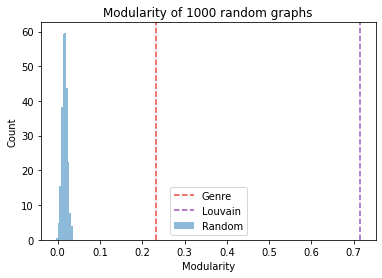

In [80]:
plt.hist(modularity_list, bins=10, alpha=0.5, label='Random', density=True)
plt.axvline(modularity(G_pop, genre_partitioning), color = '#E74C3C', linestyle='--', label='Genre')
plt.axvline(louvain_modularity, color = '#9B59B6', linestyle='--', label='Louvain')
plt.legend()
plt.title(f'Modularity of {N} random graphs')
plt.xlabel('Modularity')
plt.ylabel('Count')
plt.show()

Looking at the figure above, we see that both partitioning methods lead to a modularity significantly different from 0 and thereby also larger than any of those from the random networks. Though, as touched upon previously, the modularity of the network partitioned using the Louvain algorithm is much larger than the genre partition. To understand how this partition looks, we will be visualising the graph with the Louvain partitioning.

In [81]:
G_pop_louvain_partition = community.best_partition(G_pop)
G_pop_louvain = G_pop.copy()
for artist, data in G_pop_louvain.nodes(data=True):
    data['group'] = G_pop_louvain_partition[artist]

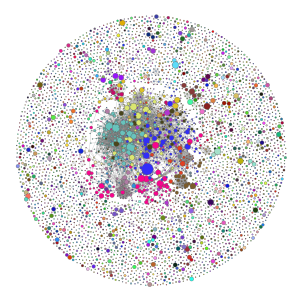

In [82]:
network_G_pop_louvain, _ = nw.visualize(G_pop_louvain, config=config, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network_G_pop_louvain)

Noticeable here is that the Louvain algorithm manages to divide the pop artists into communities that make decent sense. E.g. some of the rappers and R&B artists are grouped as red nodes, whereas female artists like Taylor Swift are seen in very light green and other artists like Beyoncé and Rihanna in light green. Very interesting.

Let's see the communities we have in total:

In [83]:
print(f'Number of groups using genres: {len(set(data["group"] for art, data in G_pop.nodes(data=True)))}')
print(f'Number of groups using Louvain: {max(G_pop_louvain_partition.values())+1}')

Number of groups using genres: 18
Number of groups using Louvain: 3382


We here see that the Louvain algorithm partitions the network into 3328 groups, which is quite a lot compared to the 4802 nodes in the graph. Again, the large number of singleton nodes is likely the explanation.

### Without singletons
This then brings us on to the next analysis for the full network; the version where we will be removing singleton nodes with less than 5 songs. The following section will go through the same steps as as previously.

In [84]:
G_pop_no_singles = G_pop.copy()
for artist, data in G_pop.nodes(data=True):
    if G_pop_no_singles.degree(artist) == 0 and data['size'] < 5:
        G_pop_no_singles.remove_node(artist)

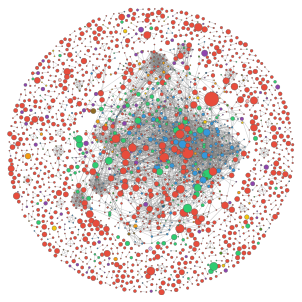

In [85]:
network_G_pop_no_singles, _ = nw.visualize(G_pop_no_singles, config=config, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network_G_pop_no_singles)
# plt.savefig("network_figures/G_no_singles.pdf")

#### Properties
Calculate basic statistics for the network

In [86]:
graph = G_pop_no_singles
print(f'Number of Nodes: {graph.number_of_nodes()}')
print(f'Number of Links: {graph.number_of_edges()}')
print(f'Density: {nx.density(graph):.5f}')
print(f'Avg. clustering: {nx.average_clustering(graph):.2f}')
degrees = list(dict(graph.degree()).values())
print(f'Average degrees: {np.mean(degrees):.2f}')
print(f'Median degrees: {np.median(degrees)}')
print(f'Mode of degrees: {stats.mode(degrees)[0][0]}')
print(f'Minimum degree: {min(degrees)}')
print(f'Maximum degree: {max(degrees)}')

Number of Nodes: 2292
Number of Links: 4250
Density: 0.00162
Avg. clustering: 0.23
Average degrees: 3.71
Median degrees: 1.0
Mode of degrees: 1
Minimum degree: 0
Maximum degree: 74


Compared to the full network, we have gone down from 4802 to 2218 nodes while keeping the same number of edges. As expected, all the other network properties have gone up, meaning that with a larger density, avg. clustering and average degrees, we should now see a more densely connected network.

#### Community detection
We will again communities of the network using both the genres and the Louvain algorithm, both of which will be compared to random networks.

First off, we will be getting the partitions based on the genres.

In [87]:
genre_partitioning = get_partitioning(G_pop_no_singles)
genre_partitioning_dict = dict()
for partition in genre_partitioning:
    for artist, data in partition.nodes(data=True):
        genre_partitioning_dict[artist] = data['group']

print(f'Genre partitioning modularity using homemade modularity function: {modularity(G_pop_no_singles, genre_partitioning):.4f}')
print(f'Genre partitioning modularity using python-louvain modularity function: {community.modularity(genre_partitioning_dict, G_pop_no_singles):.4f}')

Genre partitioning modularity using homemade modularity function: 0.2318
Genre partitioning modularity using python-louvain modularity function: 0.2859


We will now be calculating the modularity of the network based on the partitioning obtained using the Louvain algorithm.

In [88]:
louvain_modularity = community.modularity(community.best_partition(G_pop_no_singles), G_pop_no_singles)
print(f'Modularity for the full network: {louvain_modularity:.4f}')

Modularity for the full network: 0.7207


We initially see that the modularity obtained using the Louvain algorithm is almost the same as for the full network (0.7053). This is due to the Louvain algorithm not being fully optimal and non-deterministic. So as for the full graph, the modularity of the Louvain partition is more than twice the size of the genre partition.

##### Building randon network for comparison
Next up, we will generate 1000 random networks using the double edge swap algorithm. For each of these random networks, we will be partitioning them using the genres and calculate their modularities.

In [89]:
modularity_list = []
N = 1000
for i in tqdm(range(N)):
    graph = G_pop_no_singles.copy()
    RG = nx.double_edge_swap(graph, nswap=graph.number_of_edges()*1.2, max_tries=10000, seed=None)
    new_RG = nw.get_filtered_network(RG, node_group_key='group')
    RG_partitioning = get_partitioning(new_RG)
    modularity_list.append(modularity(RG, RG_partitioning))

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:12<00:00,  7.55it/s]


In [90]:
print(f'Average modularity of random networks: {np.mean(modularity_list):.4f}')
print(f'Standard deviation of modularity of random networks: {np.std(modularity_list):.4f}')

Average modularity of random networks: 0.0163
Standard deviation of modularity of random networks: 0.0062


We see that the mean and standard deviation of the modularity is 0, which is to be expected, as the networks are random, and we, therefore, shouldn't have any good partition using the genres.

To get an overview of the genre partition and the Louvain algorithm partition, we will now plot the distribution of the configuration model's modularity alongside the genre partition's modularity and the Louvain algorithm partition's modularity.

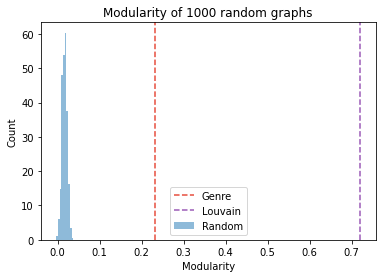

In [91]:
plt.hist(modularity_list, bins=10, alpha=0.5, label='Random', density=True)
plt.axvline(modularity(G_pop_no_singles, genre_partitioning), color = '#E74C3C', linestyle='--', label='Genre')
plt.axvline(louvain_modularity, color = '#9B59B6', linestyle='--', label='Louvain')
plt.legend()
plt.title(f'Modularity of {N} random graphs')
plt.xlabel('Modularity')
plt.ylabel('Count')
plt.show()

Looking at the figure above, we see that both partitioning methods lead to a modularity significantly different from 0 and thereby also larger than any of those from the random networks. Though, as touched upon previously, the modularity of the networks partitioned using the Louvain algorithm is much larger than for the genre partition. To understand how this partition looks, we will be visualising the graph with the Louvain partitioning.

In [92]:
G_pop_no_singles_louvain_partition = community.best_partition(G_pop_no_singles)
G_pop_no_singles_louvain = G_pop_no_singles.copy()
for artist, data in G_pop_no_singles_louvain.nodes(data=True):
    data['group'] = G_pop_no_singles_louvain_partition[artist]

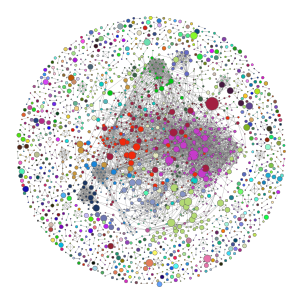

In [93]:
network_G_pop_no_singles_louvain, _ = nw.visualize(G_pop_no_singles_louvain, config=config, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network_G_pop_no_singles_louvain)

As with the previous Louvain graph, the algorithm manages to group the main clumps of nodes together quite well.

Let's see how many groups we have in this partitioning:

In [94]:
print(f'Number of groups using genres: {len(set(data["group"] for art, data in G_pop_no_singles.nodes(data=True)))}')
print(f'Number of groups using Louvain: {max(G_pop_no_singles_louvain_partition.values())+1}')

Number of groups using genres: 18
Number of groups using Louvain: 754


We here see that the Louvain algorithm partitions the network into 740 groups, which is a lot less compared to the 3328 of the last Louvain network. This means that the number of communities is reduced by 3328 - 740 = 2588 and having lost 4802 - 2218 = 2584 nodes when removing singletons, we again see that the Louvain algorithm gives all singleton nodes their own community.

## Retrieving statistics and visualisations for the remaining genres
For the remaining genres: _rap_, _rock_, _R&B_, _country_, _soul_, _ballad_, _hip-hop_, _trap_, _singer-songwriter_ and _funk_, we will be gathering statistics and be making visualisations of the networks with and without singletons with the genre community partition and the Louvain community partition, as this information will be used on the website. However, these results will not be shown here in the notebook, as it would simply take up too much space.

The following function takes in a genre and a graph -> computes and saves statistics and network graph visualisation for both the genre partition and the Louvain partition for the graph with and without singletons. 

In [95]:
def save_all_networks(genre, G):
    """ -------------------------- With singletons -------------------------- """
    # Get network for specified genre
    if genre == 'all':
        G_genre = G
    else:
        G_genre = get_network_by_genre(G, genre)
        for artist, data in G_genre.nodes(data=True):
            data['size'] = artist_genres_count[artist][genre]
        
    # Visualise network
    network_G_genre, config_genre = nw.visualize(G_genre, config=config, plot_in_cell_below=False)
    network_G_genre_data = nx.node_link_data(G_genre)
    
    size_map = {node['id']: node['size'] for node in network_G_genre_data['nodes']}
    for node in network_G_genre['nodes']:
        node['size'] = size_map[node['id']]
    
    # Make folder and save network and config
    filepath = f'../content/networks/{genre}/withsingles/genre'
    if not os.path.exists(filepath):
        os.makedirs(filepath)
    with open(f'../content/networks/{genre}/withsingles/genre/network.json', 'w') as fp:
        json.dump(network_G_genre, fp)
    with open(f'../content/networks/{genre}/withsingles/genre/config.json', 'w') as fp:
        json.dump(config_genre, fp)

    # Get statistics for network and save in folder
    stats_genre = dict()
    degrees = list(dict(G_genre.degree()).values())
    stat_names = ["Number of nodes", "Number of links", "Denisty", 
                  "Average clustering", "Average degree", "Max degree"]
    stat_vals = [G_genre.number_of_nodes(), G_genre.number_of_edges(), round(nx.density(G_genre),5), 
                 round(nx.average_clustering(G_genre), 2), round(np.mean(degrees), 2), max(degrees)]
    for name, val in zip(stat_names, stat_vals):
        stats_genre[name] = val
    
    # Calculate top-10 betweenness centrality
    bc = nx.betweenness_centrality(G_genre)
    sorted_bc = {k: v for k, v in sorted(bc.items(), key=lambda item: item[1], reverse=True)}
    sorted_bc_top10 = {k: round(v, 4) for k, v in list(sorted_bc.items())[:10]}
    stats_genre['Betweenness centrality'] = sorted_bc_top10
    
    # Calculate modularity
    genre_partitioning = get_partitioning(G_genre)
    stats_genre['Modularity'] = round(modularity(G_genre, genre_partitioning), 2)
    
    with open(f'../content/networks/{genre}/withsingles/genre/stats.json', 'w') as fp:
        json.dump(stats_genre, fp)
        
    """ -------------------------- With singletons Louvain -------------------------- """
    # Get Louvain partitioning
    G_louvain_partition = community.best_partition(G_genre)
    G_louvain = G_genre.copy()
    for artist, data in G_louvain.nodes(data=True):
        data['group'] = G_louvain_partition[artist]
    
    # Visualise network
    network_G_louvain, config_louvain = nw.visualize(G_louvain, config=config, plot_in_cell_below=False)
    network_G_louvain_data = nx.node_link_data(G_louvain)
    
    size_map = {node['id']: node['size'] for node in network_G_louvain_data['nodes']}
    for node in network_G_louvain['nodes']:
        node['size'] = size_map[node['id']]

    # Calculate modularity
    stats_genre['Modularity'] = round(community.modularity(G_louvain_partition, G_louvain), 2)
        
    # Make folder and save network and config
    filepath = f'../content/networks/{genre}/withsingles/louvain'
    if not os.path.exists(filepath):
        os.makedirs(filepath)
    with open(f'../content/networks/{genre}/withsingles/louvain/network.json', 'w') as fp:
        json.dump(network_G_louvain, fp)
    with open(f'../content/networks/{genre}/withsingles/louvain/config.json', 'w') as fp:
        json.dump(config_louvain, fp)
    with open(f'../content/networks/{genre}/withsingles/louvain/stats.json', 'w') as fp:
        json.dump(stats_genre, fp)
    
    
    """ -------------------------- Without singletons -------------------------- """
    ## Make networks without singletons with less than 5 songs
    G_genre_no_singles = G_genre.copy()
    for artist, data in G_genre.nodes(data=True):
        if G_genre_no_singles.degree(artist) == 0 and data['size'] < 5:
            G_genre_no_singles.remove_node(artist)
    
    # Visualise network
    network_G_genre_no_singles, config_genre_no_singles = nw.visualize(G_genre_no_singles, config=config, plot_in_cell_below=False)
    network_G_genre_no_singles_data = nx.node_link_data(G_genre_no_singles)
    
    size_map = {node['id']: node['size'] for node in network_G_genre_no_singles_data['nodes']}
    for node in network_G_genre_no_singles['nodes']:
        node['size'] = size_map[node['id']]

    
    # Make folder and save network and config
    filepath = f'../content/networks/{genre}/withoutsingles/genre'
    if not os.path.exists(filepath):
        os.makedirs(filepath)
    with open(f'../content/networks/{genre}/withoutsingles/genre/network.json', 'w') as fp:
        json.dump(network_G_genre_no_singles, fp)
    with open(f'../content/networks/{genre}/withoutsingles/genre/config.json', 'w') as fp:
        json.dump(config_genre_no_singles, fp)
    
    # Get statistics for network and save in folder
    stats_genre_no_singles = dict()
    degrees_no_singles = list(dict(G_genre_no_singles.degree()).values())
    stat_names = ["Number of nodes", "Number of links", "Denisty", 
                  "Average clustering", "Average degree", "Max degree"]
    stat_vals = [G_genre_no_singles.number_of_nodes(), G_genre_no_singles.number_of_edges(), round(nx.density(G_genre_no_singles),5), 
                 round(nx.average_clustering(G_genre_no_singles), 2), round(np.mean(degrees_no_singles), 2), max(degrees_no_singles)]
    for name, val in zip(stat_names, stat_vals):
        stats_genre_no_singles[name] = val
    
    # Calculate modularity
    genre_no_singles_partitioning = get_partitioning(G_genre_no_singles)
    stats_genre_no_singles['Modularity'] = round(modularity(G_genre_no_singles, genre_no_singles_partitioning), 2)
    
    # Calculate top-10 betweenness centrality
    bc = nx.betweenness_centrality(G_genre_no_singles)
    sorted_bc = {k: v for k, v in sorted(bc.items(), key=lambda item: item[1], reverse=True)}
    sorted_bc_top10 = {k: round(v, 4) for k, v in list(sorted_bc.items())[:10]}
    stats_genre_no_singles['Betweenness centrality'] = sorted_bc_top10

    with open(f'../content/networks/{genre}/withoutsingles/genre/stats.json', 'w') as fp:
        json.dump(stats_genre_no_singles, fp)
    
    """ -------------------------- Without singletons Louvain -------------------------- """
    # Get Louvain partitioning
    G_louvain_partition_no_singles = community.best_partition(G_genre_no_singles)
    G_louvain_no_singles = G_genre_no_singles.copy()
    for artist, data in G_louvain_no_singles.nodes(data=True):
        data['group'] = G_louvain_partition_no_singles[artist]
    
    # Visualise network
    network_G_louvain_no_singles, config_louvain_no_singles = nw.visualize(G_louvain_no_singles, config=config, plot_in_cell_below=False)
    network_G_louvain_no_singles_data = nx.node_link_data(G_louvain_no_singles)
    
    size_map = {node['id']: node['size'] for node in network_G_louvain_no_singles_data['nodes']}
    for node in network_G_louvain_no_singles['nodes']:
        node['size'] = size_map[node['id']]
    
    # Calculate modularity
    stats_genre_no_singles['Modularity'] = round(community.modularity(G_louvain_partition_no_singles, G_louvain_no_singles), 2)
    
    # Make folder and save network and config
    filepath = f'../content/networks/{genre}/withoutsingles/louvain'
    if not os.path.exists(filepath):
        os.makedirs(filepath)
    with open(f'../content/networks/{genre}/withoutsingles/louvain/network.json', 'w') as fp:
        json.dump(network_G_louvain_no_singles, fp)
    with open(f'../content/networks/{genre}/withoutsingles/louvain/config.json', 'w') as fp:
        json.dump(config_louvain_no_singles, fp)
    with open(f'../content/networks/{genre}/withoutsingles/louvain/stats.json', 'w') as fp:
        json.dump(stats_genre_no_singles, fp)

In [96]:
#save_all_networks('funk', G)

## Text Analysis
This part of the notebook will contain different analyses of the song lyrics. The main methods used are TF-IDF scores which will be used to create word clouds, sentiment analysis, dispersion plots, and lastly, LSA will be performed to calculate similarities between artists. Most of these methods will be applied in multiple scenarios. In general, the songs will be analysed with respect to the decade in which they were released and also according to the genre to which they belong.

In [97]:
def lexical_diversity(text):
    return len(set(text)) / len(text)

### Preprocessing lyrics
Before conducting any analysis, the lyrics are preprocessed to prepare the data. All lyrics are tokenized and lemmatized using `nltk`, and all tokens containing a non-alphabetic character are removed. All characters are made lowercase, and for every song, each word is only counted once. This is done since it is typical for songs to contain a lot of repetition (as it makes the lyrics easier to remember).

In [98]:
songData = pd.read_pickle('songData_sorted.df')

In [99]:
# This has been done and saved to songData!

# Stopwords = set(w for w in stopwords.words('english'))
# lem_fun = WordNetLemmatizer()

# all_tokens = []
# all_tokens_repeat = []
# for t in songData.lyrics:
#     tokens = list(lem_fun.lemmatize(token.lower()) for token in nltk.word_tokenize(t) if token.isalpha() and lem_fun.lemmatize(token.lower()) not in Stopwords)
#     all_tokens_repeat.append(tokens)
#     all_tokens.append(list(set(tokens)))

# songData['tokens'] = all_tokens
# songData['tokens_repeat'] = all_tokens_repeat

### Fraction of genres pr. decade
Since the data stems from the Billboard hot 100 chart, it is possible to show how dominant some genres have been over time. The figure below shows how much of the music on the chart was labelled as the given genre in each decade. Note that most songs have plenty of genre tags, so the ratios do not sum to 1 (also, only the most popular genres are shown).

In [100]:
top_genres = ['pop', 'rock', 'rap', 'r&b', 'country', 'soul',
              'singer-songwriter', 'trap', 'ballad', 'uk',
              'funk', 'dance', 'electronic', 'folk',
              'jazz', 'blues']

decade_genre_df = pd.DataFrame(None, columns=top_genres)
percentage_df = pd.DataFrame(None, columns=top_genres)
decade_genre_list = {decade: [0]*len(top_genres) for decade in range(1960, 2021, 10)}

for tokens, release, genres in zip(songData.tokens, songData.released, songData.genres):
    decade = max(int(int(release[:4]) / 10) * 10, 1960)
    for i, genre in enumerate(top_genres):
        if genre in genres:
            decade_genre_list[decade][i] += 1

for decade, counts in decade_genre_list.items():
    decade_genre_df.loc[decade] = decade_genre_list[decade]
    decade_count = sum(decade_genre_list[decade])
    percentage_df.loc[decade] = [c/decade_count for c in decade_genre_list[decade]]

decade_genre_df

,pop,rock,rap,r&b,country,soul,singer-songwriter,trap,ballad,uk,funk,dance,electronic,folk,jazz,blues
1960,3711,909,64,753,382,506,86,2,71,102,94,2,0,80,69,58
1970,2570,1268,43,844,375,582,288,0,192,165,293,19,3,75,24,34
1980,2482,1231,103,606,102,287,250,0,174,248,199,89,37,14,29,13
1990,1453,621,700,763,229,309,138,2,163,103,60,94,72,16,13,7
2000,1241,937,1004,748,613,218,304,31,287,64,48,63,70,24,14,15
2010,1814,650,2011,873,760,129,482,848,427,242,45,231,301,45,19,20
2020,432,72,851,254,155,39,189,571,95,47,13,46,61,35,4,2


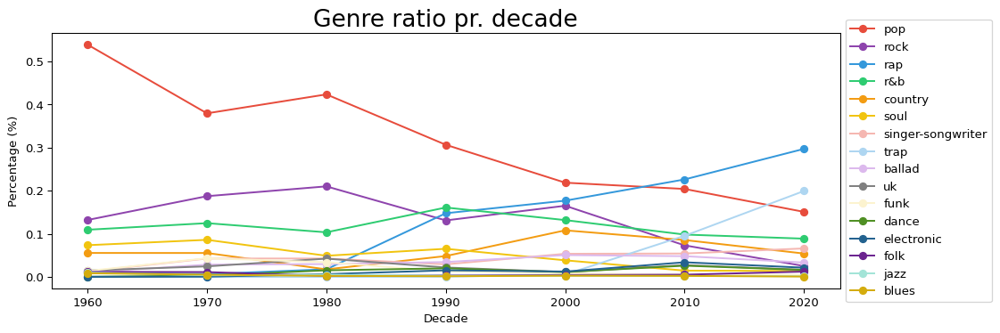

In [101]:
color_picker = {'pop': '#E74C3C', 
                'rock': '#8E44AD', 
                'rap': '#3498DB', 
                'r&b': '#2ECC71', 
                'country': '#F39C12', 
                'soul': '#F1C40F',
                'ballad': '#DCB9ED',
                'trap': '#AED6F1',
                'singer-songwriter':'#F5B7B1', 
                'funk': '#FCF3CF', 
                'dance': '#4F8F23',
                'electronic': '#23628F',
                'folk': '#6B238F',
                'jazz': '#A3E4D7',
                'blues': '#D4AC0D', 'uk': 'grey'}

plt.figure(figsize=(12,4), dpi=95)
n_decades = len(percentage_df)
for col in percentage_df.columns:
    plt.plot(range(n_decades), percentage_df[col], 'o-', c=color_picker[col], label=col)
plt.title('Genre ratio pr. decade', size=20)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.xticks(range(n_decades), decade_genre_list.keys())
plt.xlabel('Decade')
plt.ylabel('Percentage (%)')
plt.savefig("../static/images/genre_per_decade.png", bbox_inches='tight')
plt.show()

This graph and the table above illustrate a clear trend. Pop has been dominating for a long time, but since 2010 rap has overtaken the throne. Nowadays, even a "subgenre" of rap, namely trap, has become more popular than pop. Another interesting fact is that rock has almost completely vanished from the charts in the last decade, whereas folk has remained consistent throughout time. This graph also illustrates when rap started gaining traction in the US around the eighties.

###  TF-IDF & Wordcloud
The TF-IDF (term frequency, inverse document frequency) score measures how much a term relates to the characteristics of a document. In this study, _terms_ are, of course, words in the lyrics of songs and _documents_ can be either decade, genre or artist - according to the scenario we are interested in analysing. The TF is simply how many times a given term occurs in the document, and IDF is a measure of how unique the term is given by:

\begin{equation}
\text{idf}(t, D) = \log\left(\frac{N}{|d\in D:t\in d|}\right)
\end{equation}

where $t$ is a term and $D$ is the set of documents, denoted as the _corpus_. The TF-IDF is the product of TF and IDF, meaning that terms are most important if they frequently occur in the given document while also not appearing in any other document.

In [102]:
def idf(term: str, docs: {int: {str}}, log=np.log2):
    n = len(docs.keys())
    d = sum(term in doc for doc in docs.values())
    return log(n/d)

### Genres
The data contains 582 genres. Many of these are sub-genres of the main genres we all know and love. Notably, many songs are tagged as several different genres. This is handled by assigning the song to all genres it is tagged. This creates some overlap between the genres, but this is only an issue for subgenres. Using all genres is thus not desirable since it is not relevant how _pop_ relates to _dance-pop_ or _alternative-pop_, but it is relevant how _pop_ relates to _rap_ and _rock_. Therefore, the genres which will constitute the corpus were hand-selected from the genres which appear the most from 1960 to 2022.

In [103]:
genre_count = defaultdict(lambda: 0)

for genres in songData.genres:
    for genre in genres:
        genre_count[genre] += 1

# Handpick genres
top_genres = ['pop', 'rock', 'rap', 'r&b', 'country', 'soul',
              'singer-songwriter', 'trap', 'ballad', 'uk',
              'funk', 'dance', 'electronic', 'folk',
              'jazz', 'blues']
N = len(top_genres)

> **NOTE:** The next section's output has been limited not to clutter the notebook too much. If you want to see the full output, you can view it under the Decades part of the Text Analysis section on the [webpage](https://davidariostenfeldt.github.io/project_website/text-analysis/).

In [104]:
# Calculate all genre documents
genre_docs = defaultdict(lambda: [])

for tokens, genres in zip(songData.tokens, songData.genres):
    for genre in genres:
        genre_docs[genre] += tokens

# Choose only those in "top_genres"
top_genre_docs = {genre: doc for genre, doc in genre_docs.items() if genre in top_genres}

# Calculate the IDF scores for all terms in the corpus.
top_genre_docs_set = {genre: set(doc) for genre, doc in top_genre_docs.items()}
all_terms = set()
for doc in top_genre_docs.values():
    all_terms = all_terms.union(set(doc))
genre_idf_dict = {t: idf(t, top_genre_docs_set) for t in all_terms}


pri = True
# Loop through all top genres and calculate TF-IDF
for genre, doc in top_genre_docs.items():
    if pri:
        print('='*50)
        print(genre)

    fdist = nltk.FreqDist(doc)
    N = len(doc)

    stock_tfidf = {t: fdist.freq(t) * genre_idf_dict[t] for t in set(doc)}
    tfidf_keys = [k[0] for k in sorted(stock_tfidf.items(), key=lambda x: x[1], reverse=True)[:10]]
    
    if pri:
        print(f'{"TF":>14} {"TFIDF":>25}')
        i = 1
        for (tf_word, _), iftdf_word in zip(fdist.most_common(10), tfidf_keys[:10]):
            print(f'{str(i)+".":<4} {tf_word:<8} {_/N:.4f} {iftdf_word:>17} {stock_tfidf[iftdf_word]:.5f}')
            i += 1
        print('')
    pri = False

pop
            TF                     TFIDF
1.   know     0.0100            chorus 0.00009
2.   love     0.0099     miscellaneous 0.00007
3.   oh       0.0077            broken 0.00006
4.   like     0.0077             party 0.00006
5.   got      0.0072          breaking 0.00006
6.   time     0.0070           breathe 0.00005
7.   go       0.0066           rainbow 0.00005
8.   one      0.0063            happen 0.00005
9.   na       0.0062             nigga 0.00005
10.  see      0.0062            spoken 0.00005



As is evident by the output above, the TF-IDF scores succeed in highlighting a lot of the characteristics of the different genres.

**Wordclouds** are useful for illustrating the important terms since the importance corresponds to the font size of the term. This makes for a nice visual representation which grants a much clearer overview of the similarities and differences between documents (in this case, genres)

As a small note, the word clouds are displayed with masks of well-known musicians from the given genre. The original images are transparently overlayed to aid the image's clarity. These images are used on the website, and to avoid any ugly background, a background-removing-helper-function is implemented

In [105]:
# With inspiration from Geeksforgeeks
def convertImage(file):
    img = Image.open(file)
    img = img.convert("RGBA")
  
    datas = img.getdata()
    newData = []
    for item in datas:
        if item[0] == 255 and item[1] == 255 and item[2] == 255:
            newData.append((255, 255, 255, 0))
        else:
            newData.append(item)
  
    img.putdata(newData)
    return img

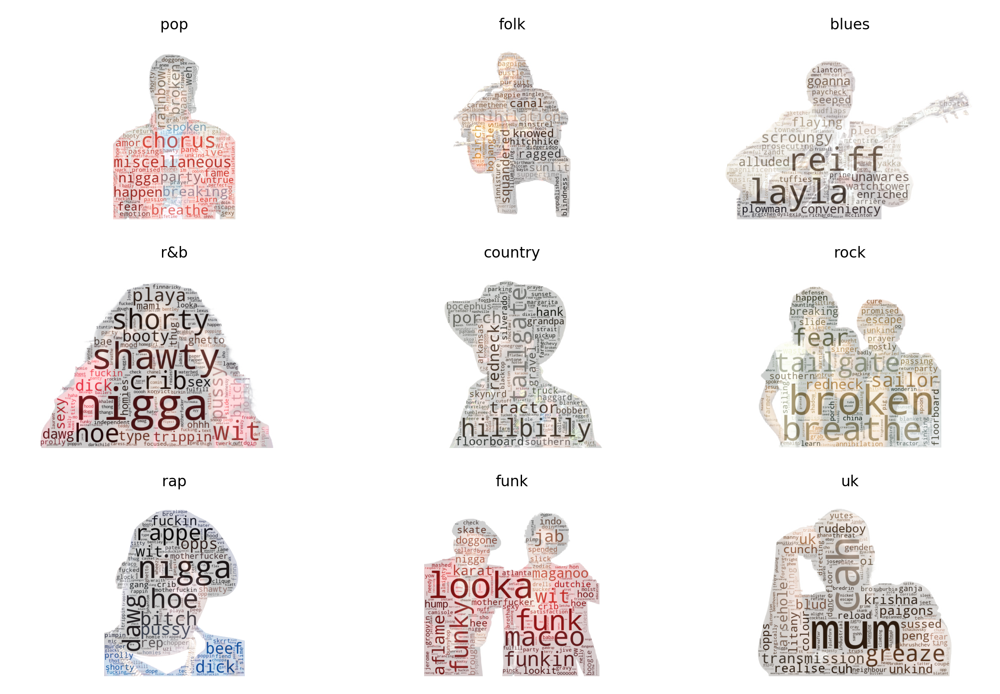

In [106]:
# Load genre images
genre_files = glob('wordcloud_masks/genres/*')
genres_with_images = {file.split('\\')[-1].split('.')[0]: file for file in genre_files}
genre_ims = {genre: np.array(Image.open(f"wordcloud_masks/genres/{genre}.jpg")) for genre in top_genre_docs.keys() if genre in genres_with_images.keys()}

# Create Wordclouds in 3x3 grid and save figure with transparent background
plt.figure(dpi=400)
for i, genre in enumerate(genre_ims.keys()):
    fdist = nltk.FreqDist(genre_docs[genre])
    genre_tfidf = {t: fdist.freq(t) * genre_idf_dict[t] for t in set(genre_docs[genre])}
    wc = WordCloud(mode='RGBA', background_color=None, mask=genre_ims[genre])
    wc.generate_from_frequencies(genre_tfidf)
    image_colors = ImageColorGenerator(genre_ims[genre])
    plt.subplot(3, 3, i+1)
    plt.imshow(wc.recolor(color_func=image_colors), interpolation='bilinear')
    im = convertImage(f"wordcloud_masks/genres/{genre}.jpg")
    plt.imshow(im, interpolation='nearest', alpha=0.2)
    plt.title(genre, fontsize=6)
    plt.axis("off")
plt.tight_layout()
plt.savefig('../static/images/genre_clouds.png', bbox_inches='tight')
plt.show()

The masks have been chosen somewhat arbitrarily, but hopefully, some artists are recognisable. Looking at the word cloud for country, an extremely clear tendency is evident. All terms of significant TF-IDF score describe everyday activities relevant for _farmers_ in the US and alike. The UK word cloud contains a lot of British slang such as _mum_, _paigons_, _blud_ and _ting_, and the rap word cloud is all about the harsh language known for today.

### Decade
The same procedure is then done while instead dividing the songs according to the decade in which they were released.

> **NOTE:** The next section's output has been limited not to clutter the notebook too much. If you want to see the full output, you can view it under the Decades part of the Text Analysis section on the [webpage](https://davidariostenfeldt.github.io/project_website/text-analysis/).

In [107]:
# Create decade documents
decade_docs = defaultdict(lambda: [])
for tokens, release, genres in zip(songData.tokens, songData.released, songData.genres):
    decade = max(int(int(release[:4]) / 10) * 10, 1960)
    decade_docs[decade] += tokens
decade_docs = {k: v for k, v in sorted(decade_docs.items(), key=lambda item: int(item[0]))}

# Calculate IDF scores
decade_docs_set = {decade: set(doc) for decade, doc in decade_docs.items()}
all_terms = set()
for doc in decade_docs.values():
    all_terms = all_terms.union(set(doc))
idf_dict = {t: idf(t, decade_docs_set) for t in all_terms}

pri = True
# Calculate TF-IDF scores
for decade, doc in decade_docs.items():
    if pri:
        print('='*50)
        print(decade)

    fdist = nltk.FreqDist(doc)
    N = len(doc)

    stock_tfidf = {t: fdist.freq(t) * idf_dict[t] for t in set(doc)}
    tfidf_keys = [k[0] for k in sorted(stock_tfidf.items(), key=lambda x: x[1], reverse=True)[:10]]
    
    if pri:
        print(f'{"TF":>14} {"TFIDF":>25}')
        i = 1
        for (tf_word, _), iftdf_word in zip(fdist.most_common(10), tfidf_keys[:10]):
            print(f'{str(i)+".":<4} {tf_word:<8} {_/N:.4f} {iftdf_word:>17} {stock_tfidf[iftdf_word]:.5f}')
            i += 1
        print('')
    pri = False

1960
            TF                     TFIDF
1.   love     0.0122            watusi 0.00011
2.   know     0.0103          tenderly 0.00009
3.   oh       0.0083             looka 0.00007
4.   go       0.0069            sighin 0.00007
5.   got      0.0069             hully 0.00006
6.   like     0.0068            billow 0.00006
7.   come     0.0067             rovin 0.00006
8.   one      0.0066            fickle 0.00005
9.   baby     0.0065             twine 0.00005
10.  time     0.0064           doggone 0.00005



In [108]:
class MyColorFunctor():
    def __init__(self, tfidf):
        self.tfidf = tfidf
        self.high = max(tfidf.values())
        self.low = min(tfidf.values())

    def scale(self, x):
        return 210 + (x - self.low)/(self.high - self.low) * 150

    def __call__(self,word,font_size,position,orientation,random_state=None,**kwargs):
        return "hsl(%d, 80%%, %d%%)" % (self.scale(self.tfidf[word]), 50)

> **NOTE:** The next section's output has been limited not to clutter the notebook too much. If you want to see the full output, you can view it under the Decades part of the Text Analysis section on the [webpage](https://davidariostenfeldt.github.io/project_website/text-analysis/).

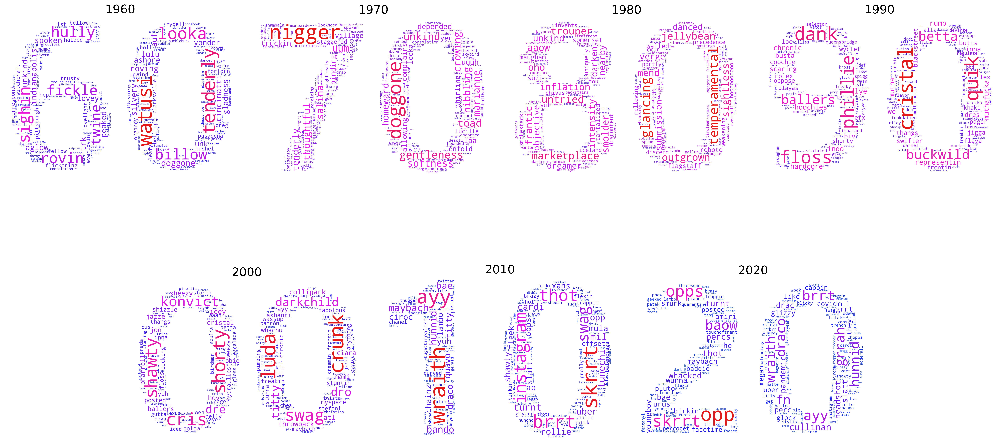

In [109]:
decade_ims = {decade: np.array(Image.open(f"wordcloud_masks/decades/{decade}.png")) for decade in decade_docs.keys()}
n_decades = len(decade_docs.keys())
plt.figure(figsize=(30,15), dpi=400)
gs = gridspec.GridSpec(2, n_decades+1)
for i, (decade, doc) in enumerate(decade_docs.items()):
    fdist = nltk.FreqDist(doc)
    decade_tfidf = {t: fdist.freq(t) * idf_dict[t] for t in set(doc)}
    wordcloud = WordCloud(mode='RGBA', background_color=None, mask=decade_ims[decade], color_func=MyColorFunctor(decade_tfidf))
    wordcloud.generate_from_frequencies(decade_tfidf)
    
    if i < ((n_decades+1)//2):
        ax = plt.subplot(gs[0, 2 * i:2 * i + 2])
    else:
        ax = plt.subplot(gs[1, 2 * i - n_decades:2 * i + 2 - n_decades])
    
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(decade, size=20)
    plt.axis("off")
plt.savefig('decade_wordcloud.png')
plt.show()

pri = False
if pri:
    for i, (decade, doc) in enumerate(decade_docs.items()):
        fdist = nltk.FreqDist(doc)
        decade_tfidf = {t: fdist.freq(t) * idf_dict[t] for t in set(doc)}
        wordcloud = WordCloud(mode='RGBA', background_color=None, mask=decade_ims[decade], color_func=MyColorFunctor(decade_tfidf))
        wordcloud.generate_from_frequencies(decade_tfidf)

        plt.figure(dpi=100)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(decade, fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(f'../static/images/decades/{decade}.png')

In the '60s, '70s and '80s, most words are completely normal words which everyone might use in their everyday life. Some perhaps more expressive than ordinary speech, but still real words. Also, some quite romantic words like _tenderly_ are used. In the '60s, the word _watusi_ was used a lot. That is because it is the name of a popular dance at the time. In the '70s, doggone is used a lot. In more recent times, it has been completely replaced with the term _damn_. In the seventies, the term _nigger_ also has a high TF-IDF score which is surprising, but the reason is that five different songs mention the word in the '70s, and it is never mentioned in another decade. In most of these songs, it is used to provoke.

The '90s almost seem like a transitioning time from the old school to the new school of mainstream music. That is when rap entered the music scene for good. In the '00s, mostly slang words fill the word cloud. These slang words are mainly attributed to the rap/hip-hop artists. Some examples are _shawty_ and _swag_. Also, some of the most influential artists and producers appear, such as _Ludacris_ and _Darkchild_.

Lastly, in the '10s and '20s, the word clouds are filled with ad-libs such as _skrrt_, _brrt_, _ayy_ and _baow_, and modern slang/shorthands like _opp_ meaning opponent, and _hunnid_ meaning hundred.

### Artists
Since there are 7855 artists in the dataset, the artists who will be considered in the corpus will be those who have managed to appear on the hot 100 chart at least ten times. This is done to achieve documents that actually can have different term frequencies for each term and also to show how well-known artists differ from each other in their use of words. Identically to the genres, some songs are shared by multiple artists (thank god for that; otherwise, there would be no network). This is handled in the same way, meaning that if two artists collaborate on a song, they both are assigned all the words in the song. This seems fair since putting one's name on a song automatically means you are associated with the whole song.

In [110]:
artist_count = defaultdict(lambda: 0)

for artists in songData.artists:
    for artist in artists:
        artist_count[artist] += 1
artist_count = {k: v for k, v in sorted(artist_count.items(), key=lambda item: item[1], reverse=True)}

top_artists = list(artist for artist, count in artist_count.items() if count >= 10)
print('Total number of artists:', len(artist_count))
print('Number of top artists:', len(top_artists))

Total number of artists: 7855
Number of top artists: 735


This still is quite a lot of musicians, so some of the most well-known artists have been selected for investigation. In total, there are 41 selected artists for whom a picture of them is available - making the word clouds nicer to look at! These artists are:

In [111]:
# Create artist documents
artist_docs = defaultdict(lambda: [])
for tokens, artists in zip(songData.tokens, songData.artists):
    for artist in artists:
        artist_docs[artist] += tokens

top_artist_docs = {artist: doc for artist, doc in artist_docs.items() if artist in top_artists}

artists_with_images = {'.'.join(file.split('\\')[-1].split('.')[:-1]): file for file in glob('wordcloud_masks/artists/*')}
artist_ims = {artist: np.array(Image.open(artists_with_images[artist])) for artist in top_artist_docs.keys() if artist in artists_with_images.keys()}
print('Artists with images:')
for artist in artists_with_images.keys():
    print(artist, end=', ')

Artists with images:
aretha franklin, ariana grande, beyoncé, billie eilish, britney spears, cher, chris brown, dj khaled, drake, ed sheeran, elton john, elvis presley, eminem, frank sinatra, future, j. cole, james brown, jay-z, juice wrld, justin bieber, kanye west, katy perry, lil baby, lil durk, lil uzi vert, lil wayne, madonna, marvin gaye, michael jackson, miley cyrus, nicki minaj, prince, queen, snoop dogg, stevie wonder, taylor swift, the beatles, the weeknd, travis scott, unknown, young thug, youngboy never broke again, 

> **NOTE:** The output of the next section has been limited in order to not clutter the note book too much. If you want to see the full output you can view it under the Artists part of the Text Analysis section on the [webpage](https://davidariostenfeldt.github.io/project_website/text-analysis/).

In [112]:
# Calculate IDF scores
top_artist_docs_set = {artist: set(doc) for artist, doc in top_artist_docs.items()}
all_terms = set()
for doc in top_artist_docs.values():
    all_terms = all_terms.union(set(doc))

idf_dict = {t: idf(t, top_artist_docs_set) for t in all_terms}

pri = True
# For each artist who is a "top artist" calculate the TF-IDF scores
for artist, doc in top_artist_docs.items():
    if artist not in artist_ims.keys():
        continue
    if pri:
        print('='*50)
        print(artist)

    fdist = nltk.FreqDist(doc)
    N = len(doc)

    stock_tfidf = {t: fdist.freq(t) * idf_dict[t] for t in set(doc)}
    tfidf_keys = [k[0] for k in sorted(stock_tfidf.items(), key=lambda x: x[1], reverse=True)[:10]]
    
    if pri:
        print(f'{"TF":>14} {"TFIDF":>25}')
        i = 1
        for (tf_word, _), iftdf_word in zip(fdist.most_common(10), tfidf_keys[:10]):
            print(f'{str(i)+".":<4} {tf_word:<8} {_/N:.4f} {iftdf_word:>17} {stock_tfidf[iftdf_word]:.5f}')
            i += 1
        print('')
    pri = False

frank sinatra
            TF                     TFIDF
1.   love     0.0107         reminding 0.00657
2.   like     0.0096           musical 0.00613
3.   heart    0.0090         interlude 0.00613
4.   come     0.0090            sleigh 0.00595
5.   go       0.0079          carousel 0.00579
6.   wa       0.0079           perhaps 0.00538
7.   know     0.0079     inconceivable 0.00537
8.   never    0.0073           granada 0.00537
9.   day      0.0073              dreg 0.00537
10.  time     0.0068          slopping 0.00537



> **NOTE:** The output of the next section has been limited in order to not clutter the note book too much. If you want to see the full output you can view it under the Artists part of the Text Analysis section on the [webpage](https://davidariostenfeldt.github.io/project_website/text-analysis/).

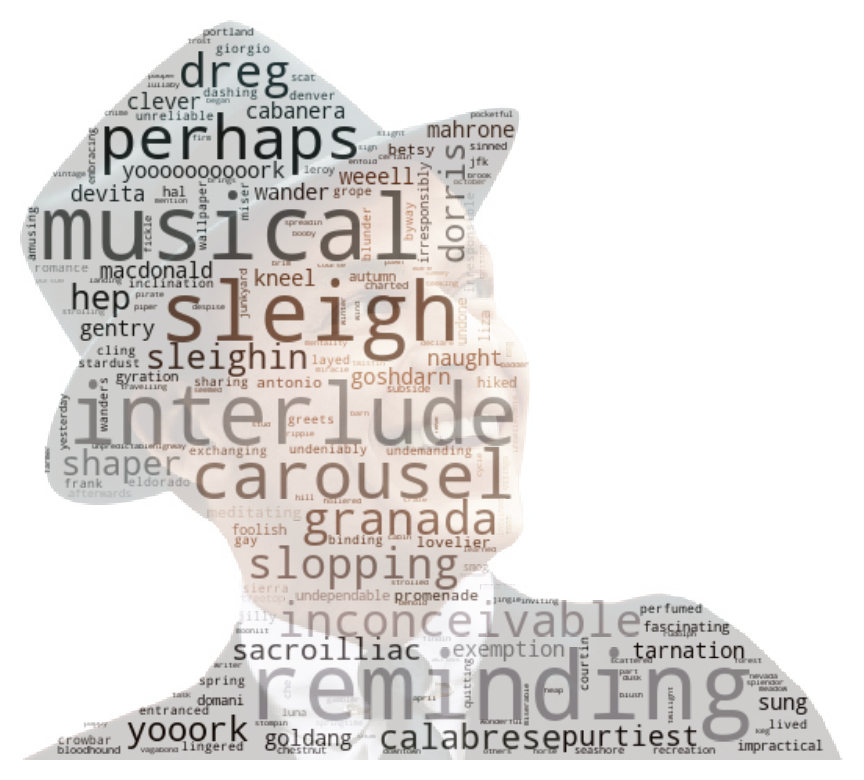

In [113]:
for i, artist in enumerate(artist_ims.keys()):
    if i > 0: break
    fdist = nltk.FreqDist(artist_docs[artist])
    artist_tfidf = {t: fdist.freq(t) * idf_dict[t] for t in set(artist_docs[artist])}
    wc = WordCloud(mode='RGBA', background_color=None, mask=artist_ims[artist]) # , color_func=MyColorFunctor(decade_tfidf)
    wc.generate_from_frequencies(artist_tfidf)
    image_colors = ImageColorGenerator(artist_ims[artist])
    plt.figure(dpi=200)
    plt.imshow(wc.recolor(color_func=image_colors), interpolation='bilinear')
    im = convertImage(f"wordcloud_masks/artists/{artist}.jpg")
    plt.imshow(im, interpolation='nearest', alpha=0.2)
    #plt.title(artist, size=20)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig('wordclouds/artists/' + artist.replace(' ', '_') + '.png', bbox_inches='tight')
    plt.show()

These word clouds tell much the same story as those of the genres and the decades. Musicians from the sixties and seventies (although also regarded as pop artists) use a vastly different language than the musicians who thrive today in the mainstream music scene. One example is Frank Sinatra, who uses many long and very expressive words such as _inconcievable_ or _reminding_. Another word which shows signs of the time when Frank Sinatra published his music is the word _musical_, which certainly was a thing which was more popular back in the day.

The mainstream rappers such as Juice Wrld use many swearwords and ad-libs. Juice Wrld died due to an overdose at a very young age, and it is no secret that he was an addict. This makes sense since his word cloud is overrun with drugs.

Another good comparison is that Elvis uses the word _darling_ a lot, whereas popular pop and rap artists nowadays use the words _bitch_ and _hoe_ A LOT more. It is also clear that the audience has changed significantly through the years.

### Dispersion plot
Dispersion plots are interesting as they can give an indication of when certain words were used in music throughout time. As the data table is sorted according to the release date, it is simple to create a dispersion plot of all the songs. A small modification to the `nltk` `dispersion_plot` function had to be implemented to allow for the `xticks` to be the decades. The function for plotting dispersion plots with custom `xticks` is shown below with the appertaining dispersion plot of certain handpicked words, which illustrate a shift in the language of the mainstream music scene.

In [114]:
# Taken directly from nltk. Modified to allow for custom xticks.
def dispersion_plot(text, words, ignore_case=False, title="Lexical Dispersion Plot", xticks=None):
    """
    Generate a lexical dispersion plot.

    :param text: The source text
    :type text: list(str) or enum(str)
    :param words: The target words
    :type words: list of str
    :param ignore_case: flag to set if case should be ignored when searching text
    :type ignore_case: bool
    """

    try:
        from matplotlib import pylab
    except ImportError as e:
        raise ValueError(
            "The plot function requires matplotlib to be installed."
            "See https://matplotlib.org/"
        ) from e

    text = list(text)
    words.reverse()

    if ignore_case:
        words_to_comp = list(map(str.lower, words))
        text_to_comp = list(map(str.lower, text))
    else:
        words_to_comp = words
        text_to_comp = text

    points = [
        (x, y)
        for x in range(len(text_to_comp))
        for y in range(len(words_to_comp))
        if text_to_comp[x] == words_to_comp[y]
    ]
    if points:
        x, y = list(zip(*points))
    else:
        x = y = ()
    pylab.plot(x, y, "b|", scalex=0.1)
    pylab.yticks(list(range(len(words))), words, color="b")
    pylab.ylim(-1, len(words))
    pylab.title(title)
    pylab.xlabel("Decade by Word Offset")
    if xticks is not None:
        pylab.xticks(*zip(*decade_tick.items()))
    plt.savefig("../static/images/dispersion.png", bbox_inches='tight')
    pylab.show()

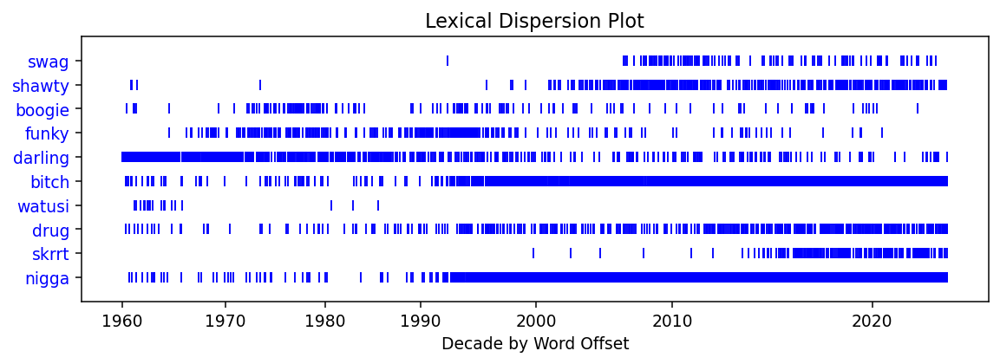

In [115]:
# Concatenate all documents together in cronological order.
all_tokens = []
decade_tick = {0: 1960}
ny = 1970
for release, tokens in zip(songData.released, songData.tokens):
    all_tokens += tokens
    year = int(release[:4])
    if year >= ny:
        decade_tick[len(all_tokens)] = ny
        ny += 10

words = nltk.Text(all_tokens)
plt.figure(figsize=(10,3), dpi=135)
dispersion_plot(words, ['swag', 'shawty', 'boogie', 'funky', 'darling' , 'bitch', 'watusi', 'drug', 'skrrt', 'nigga'], xticks=decade_tick)

One can spend an endless amount of time with interesting terms that define specific periods. Thus the dispersion plot above is far from exhaustive of the trends which came and went throughout the last six decades. However, it tells an interesting story and illustrates the beginning and end of eras.

For example, it seems almost as if the sweet word _darling_ was phased out during the nineties and replaced with the more degrading word _bitch_. _boogie_ and _funky_ also illustrate the rise and fall of funk music. It almost seems from the plot that it died out a bit in the late eighties and then came back in the nineties.

As rap hit the mainstream in the early nineties, the word _nigga_ became a fixed part of the rap songs made by black rappers. The words _swag_ and _shorty_ followed around the year 2000 - 2010 but have become less used in the present time.

The word _watusi_ is included as it is the name of a specific dance which was popular in the sixties. That is also easy to see in the dispersion plot; it is rarely used after 1970.

### Sentiment analysis
Next, the sentiment of the genres, decades and artists is investigated. Here the labMT Hedonometer data from class is used as a lookup table for the sentiment of terms. The sentiment score ranges from 0 to 10, where 0 is extremely negative, and 10 is extremely positive. The words are stored in a dictionary with their corresponding sentiment scores to allow for fast lookups. Lastly, the sentiment of a document is computed as a weighted average of the sentiment of all words in the given document, which have a sentiment score in the Hedonometer data frame. All other words are removed so that they do not count towards the average sentiment score. Otherwise, this would lead to them counting as 0, e.g. the most negative word one could imagine. Another option is to set those words to have sentiment 5 (which is in the middle), but that may create a bias since the actual average of the sentiment scores in the Hedonometer data is not 5.

In [116]:
labMT = pd.read_csv('Hedonometer.csv', index_col='Rank')
happiness_score = {w: happiness for w, happiness in zip(labMT['Word'], labMT['Happiness Score'])}
words_with_score = set(w for w in labMT['Word'])

def text_happiness_score(token_list):
    text = [w for w in token_list if w in words_with_score]
    fdist = nltk.FreqDist(text)
    return sum([happiness_score[w] * fdist.freq(w) for w in set(text)])

#### Genre
ones again the focus is on the genres previously defined as being the most popular through time.

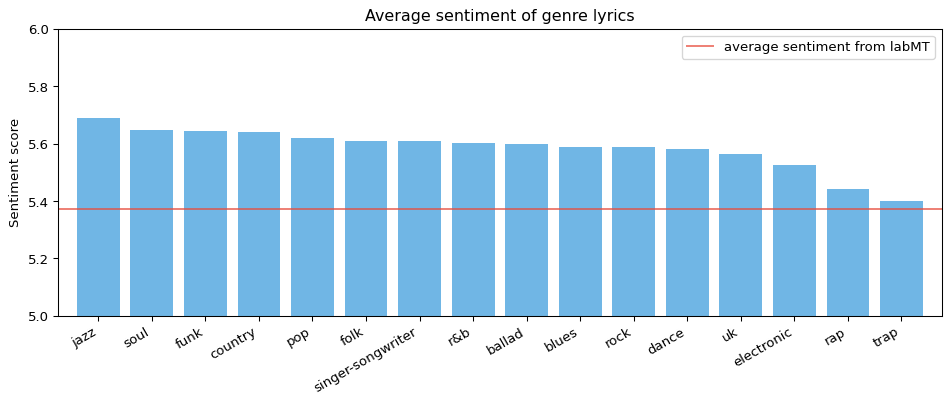

In [117]:
# Calculate sentiment for each genre
genre_happiness = {}
for genre, doc in top_genre_docs.items():
    genre_happiness[genre] = text_happiness_score(doc)
    
genre_happiness = {k: v for k, v in sorted(genre_happiness.items(), key=lambda item: item[1], reverse=True)}

plt.figure(figsize=(12,4), dpi=95)
plt.title('Average sentiment of genre lyrics')
plt.ylabel('Sentiment score')
plt.bar(*zip(*genre_happiness.items()), color='#3498DB', alpha=0.7)
plt.axhline(np.mean(list(happiness_score.values())), c='#E74C3C', alpha=0.7, label='average sentiment from labMT')
plt.xticks(rotation=30, ha='right')
plt.legend()
plt.ylim(5,6)
plt.xlim(-0.75, len(genre_happiness.items())-0.25)
plt.savefig("../static/images/genre_sentiment.png", bbox_inches='tight')
plt.show()

The results of the sentiment analysis is not very surprising. Most genres have about equal sentiment, but rap and trap have the lowest sentiment scores, albeit still above the average sentiment of all the words in the Hedonometer data. The happiest genres are jazz, soul, funk and country, closely followed by pop.

#### Decade
The same procedure is carried out now, focusing on the decades. However, the sentiment for each month is also calculated along with a rolling one year average to illustrate the finer nuances of the trend in sentiment. The rolling average is a moving mean of the a window of the points plotted. It essentially smoothes the function to highligt the general trend of the data.

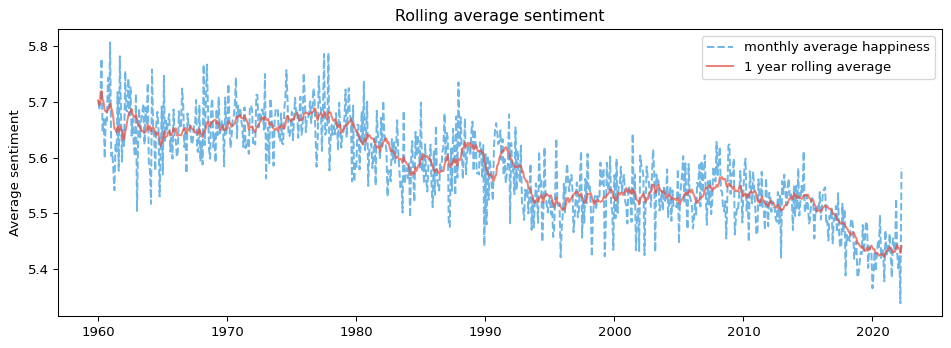

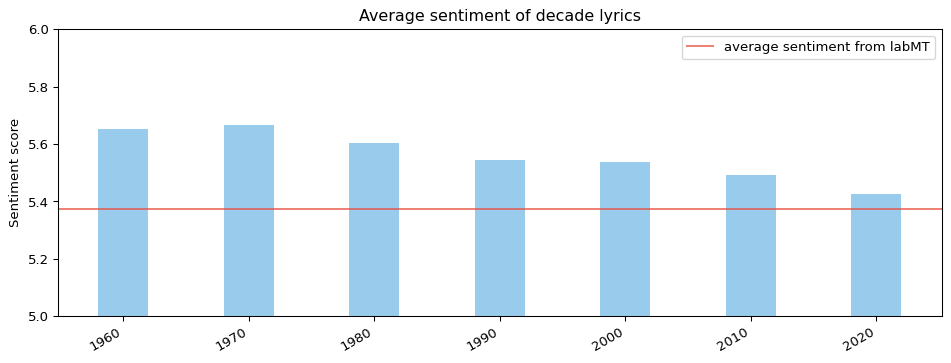

In [118]:
# Create monthly documents
month_docs = defaultdict(lambda: [])
for tokens, release in zip(songData.tokens, songData.released):
    if len(release) == 4 or int(release[:4]) < 1960:
        continue
    month_docs[release[:7]] += tokens

# Create month sentiment scores
dates = [np.datetime64(month) for month in month_docs.keys()]
month_happiness = [text_happiness_score(doc) for doc in month_docs.values()]
month_happiness = pd.Series(month_happiness, index=dates)

# Compute rolling average of 1 year and plot
rolled_series = month_happiness.rolling("365D").mean()

myFmt = mdates.DateFormatter("%Y")
fig, ax = plt.subplots(figsize=(12,4), dpi=95)
plt.title("Rolling average sentiment")
ax.plot(month_happiness.index, month_happiness.values, ls = "--", color='#3498DB', alpha=0.7, label = "monthly average happiness")
ax.plot(rolled_series.index, rolled_series.values, color = '#E74C3C', alpha=0.7, label = "1 year rolling average")
ax.set_ylabel("Average sentiment")
ax.legend()
ax.xaxis.set_major_formatter(myFmt)
plt.savefig("../static/images/rolling_sentiment.png", bbox_inches='tight')
plt.show()

# Calculate sentiment for each decade
decade_happiness = {}
for decade, doc in decade_docs.items():
    decade_happiness[decade] = text_happiness_score(doc)

plt.figure(figsize=(12,4), dpi=95)
plt.title('Average sentiment of decade lyrics')
plt.ylabel('Sentiment score')
plt.bar(*zip(*decade_happiness.items()), width=4, color='#3498DB', alpha=0.5)
plt.axhline(np.mean(list(happiness_score.values())), c='#E74C3C', alpha=0.7, label='average sentiment from labMT')
plt.xticks(rotation=30, ha='right')
plt.legend()
plt.ylim(5,6)
plt.savefig("../static/images/decade_sentiment.png",bbox_inches='tight')
plt.show()

The plot displays what has already been established. It seems that lyrics have become less happy through time, especially in the reason years. Of course, this also can be linked to the rise of the angry genres such as rap and its offspring trap. An example was seen in the dispersion plot where _darling_ was used until the nineties where _bitch_ replaced it.

In [119]:
print('Sentiment score of "bitch":', happiness_score['bitch'])
print('Sentiment score of "darling":', happiness_score['darling'])

Sentiment score of "bitch": 3.14
Sentiment score of "darling": 7.22


#### Artist

> **NOTE:** The output of the next section has been limited in order to not clutter the note book too much. If you want to see the full output you can view it under the Artists part of the Text Analysis section on the [webpage](https://davidariostenfeldt.github.io/project_website/text-analysis/).

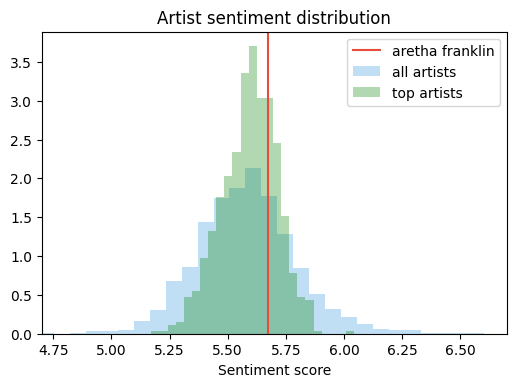

In [120]:
# Calculate sentiment for each decade
artist_happiness = {}
for artist, doc in artist_docs.items():
    artist_happiness[artist] = text_happiness_score(doc)

artist_happiness = {k: v for k, v in sorted(artist_happiness.items(), key=lambda item: item[1])}
top_artist_happiness = {k: v for k, v in sorted(artist_happiness.items(), key=lambda item: item[1]) if k in top_artists}

pri = True
for artist in artists_with_images.keys():
    if not pri:break
    if artist == 'unknown':
        continue
    plt.figure(figsize=(6,4), dpi=100)
    plt.title('Artist sentiment distribution')
    plt.hist(artist_happiness.values(), color='#3498DB', alpha=0.3, bins=40, density=True, label='all artists')
    plt.hist(top_artist_happiness.values(), color='green', alpha=0.3, bins=25, density=True, label='top artists')
    plt.xlabel('Sentiment score')
    plt.axvline(artist_happiness[artist], c='#E74C3C', label=artist)
    plt.xlim(4.7, 6.7)
    plt.legend()
    plt.savefig(f'../static/images/artist_dists/{artist}.png')
    plt.show()
    pri=False

The distribution in light blue is over all 7855 artists. The green distribution is only over the 735 top artists. The plots show the tendency of old pop artists such as The Beatles and Frank Sinatra to have happier lyrics. In contrast, rappers fall within the left part of the distribution with the lowest average sentiment. In the middle, we see a lot of popular pop artists from the last two decades. 

### LSA
Latent semantic analysis is a method for processing text where the relationship between documents and terms is analysed. In particular, it will be used to compute the similarity scores between artists. The aim is to uncover which artists are most alike and which artists are the least alike. Perhaps it will indicate artists who have used the same ghost-writers. Since songs with collaborations are assigned to all collaborating artists, they will be a lot more likely to be similar. That does, in the meantime, not mean that the result will not be interesting. Also, as mentioned before, one should think twice about putting their name on a song with lyrics that do not fit their agenda.
Cosine similarity is used since all artists are mapped into a D-dimensional space where D corresponds to the total number of words in the vocabulary. In this case, D=50,697, which is a lot!

In [121]:
def cosinesimilarity(vec1, vec2):
    return vec1@vec2 / (np.linalg.norm(vec1) * np.linalg.norm(vec2))

def similar(artist_vec, doc_term_matrix, artist=None, n=5):
    artist_id = artist2id[artist] if artist is not None else -1
    top_n_sim = [(None, -1) for _ in range(n)]
    for i, artist_b_vec in enumerate(doc_term_matrix):
        if i == artist_id:
            continue
        similarity = cosinesimilarity(artist_vec, artist_b_vec)
        if similarity > min(top_n_sim, key=lambda x: x[1])[1]:
            top_n_sim[-1] = (id2artist[i], similarity)
            top_n_sim = sorted(top_n_sim, key=lambda x: x[1], reverse=True)
    return top_n_sim

def unsimilar(artist_vec, doc_term_matrix, artist=None, n=5):
    artist_id = artist2id[artist] if artist is not None else -1
    bottom_n_sim = [(None, 1) for _ in range(n)]
    for i, artist_b_vec in enumerate(doc_term_matrix):
        if i == artist_id:
            continue
        similarity = cosinesimilarity(artist_vec, artist_b_vec)
        if similarity < max(bottom_n_sim, key=lambda x: x[1])[1]:
            bottom_n_sim[-1] = (id2artist[i], similarity)
            bottom_n_sim = sorted(bottom_n_sim, key=lambda x: x[1], reverse=False)
    return bottom_n_sim

In [122]:
# Calculate number of times each token appears (This was done to allow for words to be removed if necessary)
token_count = defaultdict(lambda: 0)
for tokens in songData.tokens:
    for token in tokens:
        token_count[token] += 1

vocabulary = list(token for token, count in token_count.items())
print('Words in vocabulary:', len(vocabulary))
word2id = {word: i for i, word in enumerate(vocabulary)}

Words in vocabulary: 50697


In [123]:
# Create unique term sets for each artist and calculate TF-IDF scores
artist_docs_set = {artist: set(doc) for artist, doc in artist_docs.items()}
idf_dict = {t: idf(t, artist_docs_set) for t in vocabulary}

artist2id = {artist: i for i, artist in enumerate(artist_docs.keys())}
id2artist = {i: artist for i, artist in enumerate(artist_docs.keys())}

# Build the term x artist matrix
term_artist_mat = np.zeros((len(artist_docs.keys()), len(vocabulary)))
for artist, doc in artist_docs.items():
    fdist = nltk.FreqDist(doc)
    for t in set(doc):
        term_artist_mat[artist2id[artist], word2id[t]] = fdist.freq(t) * idf_dict[t]

In [124]:
artist = 'justin bieber'
artist_vec = term_artist_mat[artist2id[artist]]
print('Most similar')
for i, (sim_artist, similarity) in enumerate(similar(artist_vec, term_artist_mat, artist=artist, n=5)):
    print(f'{i+1}. {sim_artist:<15} has similarity {similarity:.3f} with {artist}')
    
print('\nLeast similar')
for i, (unsim_artist, similarity) in enumerate(unsimilar(artist_vec, term_artist_mat, artist=artist, n=5)):
    print(f'{i+1}. {unsim_artist:<15} has similarity {similarity:.3f} with {artist}')

Most similar
1. ariana grande   has similarity 0.615 with justin bieber
2. taylor swift    has similarity 0.615 with justin bieber
3. chris brown     has similarity 0.610 with justin bieber
4. the weeknd      has similarity 0.606 with justin bieber
5. drake           has similarity 0.599 with justin bieber

Least similar
1. baauer          has similarity 0.002 with justin bieber
2. kali uchis, tainy has similarity 0.003 with justin bieber
3. davon king      has similarity 0.004 with justin bieber
4. spacejam jiff   has similarity 0.004 with justin bieber
5. k.a.a.n.        has similarity 0.004 with justin bieber


To illustrate what can be done with this technique, the five artists most and least similar to Justin Bieber are shown above. The most similar artists are pop artists. Chris Brown and Drake belong to r&b and rap, respectively. However, it can indeed be argued that they are quite "pop-y". It should also be noted that Taylor Swift and Justin Bieber have not collaborated on a song, so the bias is not completely ruining the similarity scores. Looking at the least similar artists, it is a mix of different genres. K.A.A.N. is a rapper, and Kali Uchis is a modern r&b artist.

> **NOTE:** The output of the next section has been limited in order to not clutter the note book too much. If you want to see the full output you can view it under the Artists part of the Text Analysis section on the [webpage](https://davidariostenfeldt.github.io/project_website/text-analysis/).

In [125]:
pri = True
for artist in artists_with_images.keys():
    if pri == False: break
    if artist == 'unknown':
        continue
    print('='*50)
    print('Most similar to:', artist)
    artist_vec = term_artist_mat[artist2id[artist]]
    for i, (sim_artist, similarity) in enumerate(similar(artist_vec, term_artist_mat, artist=artist, n=5)):
        print(f'\t{i+1}. {sim_artist:<15} has similarity {similarity:.3f} with {artist}')
    pri = False

Most similar to: aretha franklin
	1. marvin gaye     has similarity 0.593 with aretha franklin
	2. elvis presley   has similarity 0.567 with aretha franklin
	3. stevie wonder   has similarity 0.565 with aretha franklin
	4. the temptations has similarity 0.555 with aretha franklin
	5. diana ross      has similarity 0.549 with aretha franklin


# 4. Discussion

Overall, we are quite satisfied with the results of the project. We have been able to find interesting attributes for collaborations of artists via our network analysis, and our text analysis shows how the language of the songs we listen to has changed throughout the years, but also from artist to artist and genre to genre.

The custom styling for the website that we created had a huge role in displaying the networks and text analysis parts without overwhelming the reader with a mile-long page. If time had permitted it, we would have liked to delve even deeper into the website, adding small features and making the layout even better. One such feature would be to search for artists by name and have their label appear in the networks.

Using the network theory from the course, we have created thorough analyses of the different networks for each genre. Furthermore, we expanded on the course material by calculating the betweenness centrality of the networks to see which artists were more collaborative or central than others. In addition to this, we also investigated LSA to find similar and dissimilar artists. One element of the network analysis which became apparent later on in the project was that the edges in the networks are not genre specific. This means that in the _ballad_ network, Kanye West and Lil Wayne will have a connection since they have collaborated, but it was not necessarily on a song with the _ballad_ tag. There is no doubt this would reduce the number of edges in the networks of genres which are not rap, pop and r&b and that would also be interesting to investigate. Still, since the decision was made to scale nodes by them number of songs with the given genre, the significant nodes for a given genre still stand out the most.


Unfortunately, an early look into the lexical diversity of the lyrics did not show much. Thus, it was not prioritised as highly as the other text analysis aspects. Given more time, it would be interesting to look into this thoroughly. The tendency throughout all comparisons of lexical diversity was that artists, decades and genres were heavily dependent on the varying length of the appertaining documents.


Another interesting point could be that the genres might have changed through the decades. This is not something we have looked into, but it could be done with our data. At least the pop genre has a significant number of songs throughout all decades. For example, pop music has changed a lot through the years, starting with being a mix of rock and R&B into becoming more disco-oriented. Today, it is heavily influenced by rap and electronic music. Our analysis only looked at mainstream music through each decade, which leaves out some information about how the individual genres evolved. The change in rap wordclouds from its origin in 1980s onto 2020 is certainly also an interesting topic to look into.